# **Libraries**

In [1]:
!pip install albumentations==1.3.0
!pip install segmentation-models-pytorch==0.3.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.5/123.5 kB 4.9 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 2.0.4
    Uninstalling albumentations-2.0.4:
      Successfully uninstalled albumentations-2.0.4
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.9/97.9 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.0/377.0 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━

In [2]:
# Standard library
import os
import gc
import time
import math
import random
import logging
import warnings

# Scientific computing
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt

# Deep learning
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.parametrizations import weight_norm

# Computer vision
import cv2
import torchvision

# Miscellaneous
from tqdm import tqdm
import timm
import einops
from einops import rearrange

logging.basicConfig(level=logging.ERROR)

from sklearn.model_selection import KFold
from pathlib import Path
import albumentations as A
from albumentations.pytorch import ToTensorV2

In [3]:

# Thiết lập các tham số cho training
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
NUM_EPOCHS = 10
BATCH_SIZE = 4
LEARNING_RATE = 1e-4
IMAGE_SIZE = 256
NUM_CLASSES = 3  # background, vùng xám, nhân
SEED = 42
N_FOLDS = 5  # số fold trong KFold

# **Akorn**

## **K_Utils**

In [4]:
def reshape(x: torch.Tensor, n: int):
    if x.ndim == 3:  # x.shape = ([B, T, C ])
        return x.transpose(1, 2).unflatten(1, (-1, n))
    else:  # x.shape = ([B, C, ..., ])
        return x.unflatten(1, (-1, n))


def reshape_back(x):
    if x.ndim == 4:  # Tokens
        return x.flatten(1, 2).transpose(1, 2)
    else:
        return x.flatten(1, 2)


def _l2normalize(x):
    return torch.nn.functional.normalize(x, dim=2)


def norm(n, x, dim=2, keepdim=True):
    return torch.linalg.norm(reshape(x, n), dim=dim, keepdim=keepdim)


def normalize(x: torch.Tensor, n):
    x = reshape(x, n)
    x = _l2normalize(x) 
    x = reshape_back(x)
    return x

# currently not used
def compute_exponential_map(n, x, dxdt, reshaped_inputs=False):
    if not reshaped_inputs:
        dxdt = reshape(dxdt, n)
        x = reshape(x, n)
    norm = torch.linalg.norm(dxdt, dim=2, keepdim=True)
    norm = torch.clip(norm, 0, math.pi)
    nx = torch.cos(norm) * x + torch.sin(norm) * (dxdt / (norm + 1e-5))
    if not reshaped_inputs:
        nx = reshape_back(nx)
    return nx


class Normalize(nn.Module):

    def __init__(self, n):
        super().__init__()
        self.n = n

    def forward(self, x):
        return normalize(self.n, x)

## **Common Layers**

In [5]:
class Interpolate(nn.Module):

    def __init__(self, r, mode="bilinear"):
        super().__init__()
        self.r = r
        self.mode = mode

    def forward(self, x):
        return F.interpolate(
            x, scale_factor=self.r, mode=self.mode, align_corners=False
        )


class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self, x):
        return x.view(self.shape)


class ResBlock(nn.Module):

    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x):
        return x + self.fn(x)


class PatchEmbedding(nn.Module):
    def __init__(self, img_size=32, patch_size=4, in_channels=3, embed_dim=128):
        super(PatchEmbedding, self).__init__()
        self.patch_size = patch_size
        self.embed_dim = embed_dim
        self.num_patches = (img_size // patch_size) ** 2
        self.proj = nn.Conv2d(
            in_channels, embed_dim, kernel_size=patch_size, stride=patch_size
        )

    def forward(self, x):
        x = self.proj(x)  # (B, embed_dim, H/patch_size, W/patch_size)
        x = x.flatten(2)  # (B, embed_dim, num_patches)
        x = x.transpose(1, 2)  # (B, num_patches, embed_dim)
        return x


class ReadOutConv(nn.Module):
    def __init__(
        self,
        inch,
        outch,
        out_dim,
        kernel_size=1,
        stride=1,
        padding=0,
    ):
        super().__init__()
        self.outch = outch
        self.out_dim = out_dim
        self.invconv = nn.Conv2d(
            inch,
            outch * out_dim,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
        )
        self.bias = nn.Parameter(torch.zeros(outch))

    def forward(self, x):
        x = self.invconv(x).unflatten(1, (self.outch, -1))
        x = torch.linalg.norm(x, dim=2) + self.bias[None, :, None, None]
        return x


class BNReLUConv2d(nn.Module):

    def __init__(
        self,
        inch,
        outch,
        kernel_size=1,
        stride=1,
        padding=0,
        norm=None,
        act=nn.ReLU(),
    ):
        super().__init__()
        if norm == "gn":
            norm = lambda ch: nn.GroupNorm(8, ch)
        elif norm == "bn":
            norm = lambda ch: nn.BatchNorm2d(ch)
        elif norm == None:
            norm = lambda ch: nn.Identity()
        else:
            raise NotImplementedError

        conv = nn.Conv2d(
            inch,
            outch,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
        )

        self.fn = nn.Sequential(
            norm(inch),
            act,
            conv,
        )

    def forward(self, x):
        return self.fn(x)


class FF(nn.Module):

    def __init__(
        self,
        inch,
        outch,
        hidch=None,
        kernel_size=1,
        stride=1,
        padding=0,
        norm=None,
        act=nn.ReLU(),
    ):
        super().__init__()
        if hidch is None:
            hidch = 4 * inch
        self.fn = nn.Sequential(
            BNReLUConv2d(
                inch,
                hidch,
                kernel_size=kernel_size,
                stride=stride,
                padding=padding,
                norm=norm,
                act=act,
            ),
            BNReLUConv2d(
                hidch,
                outch,
                kernel_size=kernel_size,
                stride=stride,
                padding=padding,
                norm=norm,
                act=act,
            ),
        )

    def forward(self, x):
        x = self.fn(x)
        return x


class LayerNormForImage(nn.Module):
    def __init__(self, num_features, eps=1e-5):
        super().__init__()
        self.eps = eps
        self.gamma = nn.Parameter(torch.ones(1, num_features, 1, 1))
        self.beta = nn.Parameter(torch.zeros(1, num_features, 1, 1))

    def forward(self, x):
        # x shape: [B, C, H, W]
        mean = x.mean(dim=1, keepdim=True)
        var = x.var(dim=1, keepdim=True, unbiased=False)
        x_normalized = (x - mean) / torch.sqrt(var + self.eps)
        if x.ndim == 2:
            x_normalized = self.gamma[..., 0, 0] * x_normalized + self.beta[..., 0, 0]
        else:
            x_normalized = self.gamma * x_normalized + self.beta
        return x_normalized


class ScaleAndBias(nn.Module):
    def __init__(self, num_channels, token_input=False):
        super().__init__()
        self.scale = nn.Parameter(torch.ones(num_channels))
        self.bias = nn.Parameter(torch.zeros(num_channels))
        self.token_input = token_input

    def forward(self, x):
        # Determine the shape for scale and bias based on input dimensions
        if self.token_input:
            # token input
            shape = [1, 1, -1]
            scale = self.scale.view(*shape)
            bias = self.bias.view(*shape)
        else:
            # image input
            shape = [1, -1] + [1] * (x.dim() - 2)
            scale = self.scale.view(*shape)
            bias = self.bias.view(*shape)
        return x * scale + bias


class RGBNormalize(nn.Module):
    def __init__(self, mean=(0.4914, 0.4822, 0.4465), std=(0.2023, 0.1994, 0.2010)):
        super().__init__()

        self.mean = torch.tensor(mean).view(1, len(mean), 1, 1)
        self.std = torch.tensor(std).view(1, len(std), 1, 1)

    def forward(self, x):
        if x.device != self.mean.device:
            self.mean = self.mean.to(x.device)
            self.std = self.std.to(x.device)
        return (x - self.mean) / self.std

    def inverse(self, x):
        if x.device != self.mean.device:
            self.mean = self.mean.to(x.device)
            self.std = self.std.to(x.device)
        return (x * self.std) + self.mean


class FeatureAttention(nn.Module):
    def __init__(self, n, ch):
        super().__init__()
        self.n = n
        self.ch = ch
        self.q_linear = nn.Linear(n, n)
        self.k_linear = nn.Linear(n, n)
        self.v_linear = nn.Linear(n, n)
        self.o_linear = nn.Linear(n, n)

    def forward(self, x):
        B = x.shape[0]
        q, k, v = map(lambda x: x.view(B, -1, self.n), (x, x, x))
        q = self.q_linear(q)
        k = self.k_linear(k)
        v = self.v_linear(v)

        o = F.scaled_dot_product_attention(q, k, v)
        return self.o_linear(o).view(B, -1)


class Attention(nn.Module):
    def __init__(
        self,
        ch,
        heads=8,
        weight="conv",
        kernel_size=1,
        stride=1,
        padding=0,
        gta=False,
        rope=False,
        hw=None,
    ):
        super().__init__()

        self.heads = heads
        self.head_dim = ch // heads
        self.weight = weight
        self.stride = stride

        if weight == "conv":
            self.W_qkv = nn.Conv2d(
                ch,
                3 * ch,
                kernel_size=kernel_size,
                stride=stride,
                padding=padding,
            )
            self.W_o = nn.Conv2d(
                ch,
                ch,
                kernel_size=kernel_size,
                stride=stride,
                padding=padding,
            )
        elif weight == "fc":
            self.W_qkv = nn.Linear(ch, 3 * ch)
            self.W_o = nn.Linear(ch, ch)
        else:
            raise ValueError("weight should be 'conv' or 'fc': {}".format(weight))

        self.gta = gta
        self.rope = rope
        assert (int(self.gta) + int(self.rope)) <= 1  # either gta or rope

        self.hw = hw

        if gta or rope:
            assert hw is not None
            F = self.head_dim // 4
            if self.head_dim % 4 != 0:
                F = F + 1

            if not isinstance(hw, list):
                coord = hw
                _mat = make_SO2mats(coord, F).flatten(1, 2)  # [h*w, head_dim/2, 2, 2]
            else:
                coord = make_2dcoord(hw[0], hw[1])
                _mat = (
                    make_SO2mats(coord, F).flatten(2, 3).flatten(0, 1)
                )  # [h*w, head_dim/2, 2, 2]

            _mat = _mat[..., : self.head_dim // 2, :, :]
            # set indentity matrix for additional tokens

            if gta:
                self.mat_q = nn.Parameter(_mat)
                self.mat_k = nn.Parameter(_mat)
                self.mat_v = nn.Parameter(_mat)
                self.mat_o = nn.Parameter(_mat.transpose(-2, -1))
            elif rope:
                self.mat_q = nn.Parameter(_mat)
                self.mat_k = nn.Parameter(_mat)

    def rescale_gta_mat(self, mat, hw):
        # _mat = [h*w, head_dim/2, 2, 2]
        if hw[0] == self.hw[0] and hw[1] == self.hw[1]:
            return mat
        else:
            f, c, d = mat.shape[1:]
            mat = einops.rearrange(
                mat, "(h w) f c d -> (f c d) h w", h=self.hw[0], w=self.hw[1]
            )
            mat = F.interpolate(mat[None], size=hw, mode="bilinear")[0]
            mat = einops.rearrange(mat, "(f c d) h w -> (h w) f c d", f=f, c=c, d=d)
            return mat

    def forward(self, x):

        if self.weight == "conv":
            h, w = x.shape[2] // self.stride, x.shape[3] // self.stride
        else:
            h, w = self.hw

        reshape_str = (
            "b (c nh) h w -> b nh (h w) c"
            if self.weight == "conv"
            else "b k (c nh)  -> b nh k c"
        )
        dim = 1 if self.weight == "conv" else 2
        q, k, v = self.W_qkv(x).chunk(3, dim=dim)
        q, k, v = map(
            lambda x: einops.rearrange(x, reshape_str, nh=self.heads),
            (q, k, v),
        )
        if self.gta:
            q, k, v = map(
                lambda args: rep_mul_x(self.rescale_gta_mat(args[0], (h, w)), args[1]),
                ((self.mat_q, q), (self.mat_k, k), (self.mat_v, v)),
            )
        elif self.rope:
            q, k = map(
                lambda args: rep_mul_x(args[0], args[1]),
                ((self.mat_q, q), (self.mat_k, k)),
            )

        x = torch.nn.functional.scaled_dot_product_attention(
            q, k, v, attn_mask=self.mask if hasattr(self, "mask") else None
        )

        if self.gta:
            x = rep_mul_x(self.rescale_gta_mat(self.mat_o, (h, w)), x)

        if self.weight == "conv":
            x = einops.rearrange(x, "b nh (h w) c -> b (c nh) h w", h=h, w=w)
        else:
            x = einops.rearrange(x, "b nh k c -> b k (c nh)")

        x = self.W_o(x)

        return x

## **GTA**

In [6]:
def make_2dcoord(H, W, normalize=False):
    """
    Return(torch.Tensor): 2d coord values of shape [H, W, 2]
    """
    x = np.arange(H, dtype=np.float32)  # [0, H)
    y = np.arange(W, dtype=np.float32)  # [0, W)
    if normalize:
        x = x / H
        y = y / W
    x_grid, y_grid = np.meshgrid(x, y, indexing="ij")
    return torch.Tensor(
        np.stack([x_grid.flatten(), y_grid.flatten()], -1).reshape(H, W, 2)
    )


def make_SO2mats(coord, nfreqs):
    """
    Args:
    coord: [..., 2 or 3]
    freqs: [n_freqs, 2 or 3]
    Return:
    mats of shape [..., n_freqs, (2 or 3), 2, 2]
    """
    dim = coord.shape[-1]
    b = 10000.0
    freqs = torch.exp(torch.arange(0.0, 2 * nfreqs, 2) * -(math.log(b) / (2 * nfreqs)))
    grid_ths = [
        torch.einsum("...i,j->...ij", coord[..., d : d + 1], freqs).flatten(-2, -1)
        for d in range(dim)
    ]

    _mats = [
        [
            torch.cos(grid_ths[d]),
            -torch.sin(grid_ths[d]),
            torch.sin(grid_ths[d]),
            torch.cos(grid_ths[d]),
        ]
        for d in range(dim)
    ]
    mats = [
        rearrange(torch.stack(_mats[d], -1), "... (h w)->... h w", h=2, w=2)
        for d in range(dim)
    ]
    mat = torch.stack(mats, -3)
    return mat


# GTA
@torch.jit.script
def rep_mul_x(rep, x):
    #  rep.shape=[T, F, 2, 2], x.shape=[B, H, T, F*2]
    shape = x.shape
    d = rep.shape[-1]
    return (
        (rep[None, None] * (x.unflatten(-1, (-1, d))[..., None, :])).sum(-1).view(shape)
    )


@torch.jit.script
def rep_mul_qkv(rep, q, k, v):
    return rep_mul_x(rep, q), rep_mul_x(rep, k), rep_mul_x(rep, v)


@torch.jit.script
def rep_mul_qk(rep, q, k):
    return rep_mul_x(rep, q), rep_mul_x(rep, k)


def embed_block_diagonal(M, n):
    """
    Embed a [h*w, d/2, 2, 2] tensor M into a [h*w, d//2n, 4, 4] tensor M'
    with block diagonal structure.

    Args:
    M (torch.Tensor): Tensor of shape [h*w, d/2, 2, 2]
    n (int): Number of blocks to embed into 2nx2n structure

    Returns:
        torch.Tensor: Tensor of shape [h*w, d//2n, 4, 4]
    """
    h_w, d_half, _, _ = M.shape

    # Initialize an empty tensor for the block diagonal tensor M'
    M_prime = torch.zeros((h_w, d_half // n, 4, 4))

    # Embed M into the block diagonal structure of M_prime
    for t in range(h_w):
        for d in range(d_half // n):
            M_prime[t, d] = torch.block_diag(*[M[t, n * d + i] for i in range(n)])
    print(M_prime.shape)
    return M_prime

## **Common_FNs**

In [7]:
def positionalencoding2d(d_model, height, width):
    """
    :param d_model: dimension of the model
    :param height: height of the positions
    :param width: width of the positions
    :return: d_model*height*width position matrix
    """
    if d_model % 4 != 0:
        raise ValueError("Cannot use sin/cos positional encoding with "
                         "odd dimension (got dim={:d})".format(d_model))
    pe = torch.zeros(d_model, height, width)
    # Each dimension use half of d_model
    d_model = int(d_model / 2)
    div_term = torch.exp(torch.arange(0., d_model, 2) *
                         -(math.log(10000.0) / d_model))
    pos_w = torch.arange(0., width).unsqueeze(1)
    pos_h = torch.arange(0., height).unsqueeze(1)
    pe[0:d_model:2, :, :] = torch.sin(pos_w * div_term).transpose(0, 1).unsqueeze(1).repeat(1, height, 1)
    pe[1:d_model:2, :, :] = torch.cos(pos_w * div_term).transpose(0, 1).unsqueeze(1).repeat(1, height, 1)
    pe[d_model::2, :, :] = torch.sin(pos_h * div_term).transpose(0, 1).unsqueeze(2).repeat(1, 1, width)
    pe[d_model + 1::2, :, :] = torch.cos(pos_h * div_term).transpose(0, 1).unsqueeze(2).repeat(1, 1, width)

    return pe

## **OmegaLayer**

In [8]:
class OmegaLayer(nn.Module):

    def __init__(self, n, ch, init_omg=0.1, global_omg=False, learn_omg=True):
        super().__init__()
        self.n = n
        self.ch = ch
        self.global_omg = global_omg

        if not learn_omg:
            print("Not learning omega")

        if n % 2 != 0:
            # n is odd
            raise NotImplementedError
        else:
            # n is even
            if global_omg:
                self.omg_param = nn.Parameter(
                    init_omg * (1 / np.sqrt(2)) * torch.ones(2), requires_grad=learn_omg
                )
            else:
                self.omg_param = nn.Parameter(
                    init_omg * (1 / np.sqrt(2)) * torch.ones(ch // 2, 2),
                    requires_grad=learn_omg,
                )

    def forward(self, x):
        _x = reshape(x, 2)
        if self.global_omg:
            omg = torch.linalg.norm(self.omg_param).repeat(_x.shape[1])
        else:
            omg = torch.linalg.norm(self.omg_param, dim=1)
        omg = omg[None]
        for _ in range(_x.ndim - 3):
            omg = omg.unsqueeze(-1)
        omg_x = torch.stack([omg * _x[:, :, 1], -omg * _x[:, :, 0]], dim=2)
        omg_x = reshape_back(omg_x)
        return omg_x

## **KLayer**

In [9]:
class KLayer(nn.Module):  # Kuramoto layer

    def __init__(
        self,
        n,
        ch,
        J="conv",
        c_norm="gn",
        use_omega=False,
        init_omg=1.0,
        ksize=3,
        gta=False,
        hw=None,
        global_omg=False,
        heads=8,
        learn_omg=True,
        apply_proj=True,
    ):
        # connnectivity is either 'conv' or 'ca'
        super().__init__()
        assert (ch % n) == 0
        self.n = n
        self.ch = ch
        self.use_omega = use_omega
        self.global_omg = global_omg
        self.apply_proj = apply_proj

        self.omg = (
            OmegaLayer(n, ch, init_omg, global_omg, learn_omg)
            if self.use_omega
            else nn.Identity()
        )

        if J == "conv":
            self.connectivity = nn.Conv2d(ch, ch, ksize, 1, ksize // 2)
            self.x_type = "image"
        elif J == "attn":
            self.connectivity = Attention(
                ch,
                heads=heads,
                weight="conv",
                kernel_size=1,
                stride=1,
                padding=0,
                gta=gta,
                hw=hw,
            )
            self.x_type = "image"
        else:
            raise NotImplementedError

        if c_norm == "gn":
            self.c_norm = nn.GroupNorm(ch // n, ch, affine=True)
        elif c_norm == "sandb":
            self.c_norm = ScaleAndBias(ch, token_input=False)
        elif c_norm is None or c_norm == "none":
            self.c_norm = nn.Identity()
        else:
            raise NotImplementedError

    def project(self, y, x):
        sim = x * y  # similarity between update and current state
        yxx = torch.sum(sim, 2, keepdim=True) * x
        return y - yxx, sim

    def kupdate(self, x: torch.Tensor, c: torch.Tensor = None):
        # compute  \sum_j[J_ij x_j]
        _y = self.connectivity(x)
        # add bias c.
        y = _y + c

        if hasattr(self, "omg"):
            omg_x = self.omg(x)
        else:
            omg_x = torch.zeros_like(x)

        y = reshape(y, self.n)
        x = reshape(x, self.n)

        # project y onto the tangent space
        if self.apply_proj:
            y_yxx, sim = self.project(y, x)
        else:
            y_yxx = y
            sim = y * x

        dxdt = omg_x + reshape_back(y_yxx)
        sim = reshape_back(sim)

        return dxdt, sim

    def forward(self, x: torch.Tensor, c: torch.Tensor, T: int, gamma):
        # x.shape = c.shape = [B, C,...] or [B, T, C]
        xs, es = [], []
        c = self.c_norm(c)
        x = normalize(x, self.n)
        es.append(torch.zeros(x.shape[0]).to(x.device))
        # Iterate kuramoto update with condition c
        for t in range(T):
            dxdt, _sim = self.kupdate(x, c)
            x = normalize(x + gamma * dxdt, self.n)
            xs.append(x)
            es.append((-_sim).reshape(x.shape[0], -1).sum(-1))

        return xs, es

# **Model**

In [10]:
class UNetOscillatoryNeuron(nn.Module):

    def __init__(
        self,
        n=4, # Number of Groups
        ch=32, # Hidden Size
        L=1, # Number of Kuramoto Layers
        T=8, # Number of Kuramoto Loops per Kuramoto Layer
        psize=4, # Patch Size
        gta=True, # Global something Attention
        J="attn", # Connectivity Matrix
        ksize=1, # Kernel Size
        c_norm="gn", # Normalization for Stimuli/c
        gamma=1.0, # Gamma/dx Normalization
        imsize=256, # Input Image Size
        use_omega=True,
        init_omg=1.0,
        global_omg=False,
        maxpool=True,
        project=True,
        heads=4,
        use_ro_x=True, # Use readout
        learn_omg=True,
        no_ro=False, # Don't use readout
        autorescale=True, # Rescale Image
        debug_mode = False,
        depth = 6
    ):
        super().__init__()
        self.T = T
        self.L = L
        self.n = n
        self.ch = ch
        self.psize = psize
        self.gta = gta
        self.J = J
        self.ksize = ksize
        self.c_norm = c_norm
        self.gamma = torch.nn.Parameter(torch.Tensor([gamma]), requires_grad=False)
        self.imsize = imsize
        self.use_omega = use_omega
        self.init_omg = init_omg
        self.global_omg = global_omg
        self.maxpool = maxpool
        self.project = project
        self.heads = heads
        self.use_ro_x = use_ro_x
        self.learn_omg = learn_omg
        self.no_ro = False
        self.autorescale = autorescale
        self.fixed_ptb = False
        self.debug_mode = debug_mode
        self.depth = depth
        if self.debug_mode:
            print(f"Model is currently in Debugging Mode...")
            print(f"-"*59)
            
        self.patchfy = nn.Sequential(
            RGBNormalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
            nn.Conv2d(3, self.ch, kernel_size=psize, stride=psize, padding=0) # Read Documentation to calculate Height and Width
        )

        if not gta:
            self.pos_enc = True
            self.pemb_x = nn.Parameter(
                positionalencoding2d(ch, imsize // psize, imsize // psize).reshape(
                    -1, imsize // psize, imsize // psize
                )
            )
            self.pemb_c = nn.Parameter(
                positionalencoding2d(ch, imsize // psize, imsize // psize).reshape(
                    -1, imsize // psize, imsize // psize
                )
            )
        else:
            self.pos_enc = False

        self.AkornLayersEncode, self.T_AkornLayersEncode, self.DownLayersEncode = self.encoder(depth=self.depth)
        self.AkornLayersDecode, self.T_AkornLayersDecode, self.UpLayersDecode = self.decoder(depth=self.depth)

        self.AkornLayersBB, self.T_AkornLayersBB = self.createAkornLayers(n = self.n, ch = self.ch*(2**self.depth), num_layers = 2)

        self.unpatchfy = nn.Sequential(
            nn.ConvTranspose2d(self.ch, 3, kernel_size = psize, stride=psize, padding=0),
            nn.ReLU()
        )
        
    def createAkornLayers(self, n, ch, num_layers):
        """
        Input:
            n -> int: Number of Groups for Intrinsic Frequency/Omega
            ch -> int: Similar to "Hidden State"
            num_layers -> int: Similar to L, the number of AkornLayers
            
        Return:
            AkornLayers -> list -> list: Store all of the AkornLayers
            T_AkornLayer: Store all of the Loops for AkornLayer to pass to feature()
        """
        
        feature_hw = self.imsize // self.psize
        feature_hws = [feature_hw] * num_layers
        
        if isinstance(self.T, int):
            T_AkornLayer = [self.T] * num_layers
        else:
            T_AkornLayer = self.T

        if isinstance(self.J, str):
            J_l = [self.J] * num_layers
        else:
            J_l = self.J

        chs = [ch] * (num_layers + 1)
        
        AkornLayers = nn.ModuleList()

        # Create num_layers of Akorn Layers
        for i in range(num_layers):
            ch_i = chs[i]
            if i == num_layers - 1:
                ch_nx = chs[i+1]
            else:
                ch_nx = chs[i+1]
                
            klayer = KLayer(
                n=self.n,
                ch=ch,
                J=J_l[i],
                gta=self.gta,
                c_norm=self.c_norm,
                use_omega=self.use_omega,
                init_omg=self.init_omg,
                global_omg=self.global_omg,
                heads=self.heads,
                learn_omg=self.learn_omg,
                ksize=self.ksize,
                hw=[feature_hws[i], feature_hws[i]],
                apply_proj=self.project,
            )
            
            readout = (
                ReadOutConv(ch_i, ch_nx, n, 1, 1, 0)
                if not self.no_ro
                else nn.Identity()
            )
            linear_x = (
                nn.Conv2d(ch_i, ch_nx, 1, 1, 0)
                if self.use_ro_x and i < num_layers - 1
                else nn.Identity()
            )
            AkornLayers.append(nn.ModuleList([klayer, readout, linear_x]))  

        return AkornLayers, T_AkornLayer
        
    def feature(self, stimuli, oscillators, T_f, AkornLayer):
        """
        Input:
            stimuli/c -> tensor: Stimuli/c to input to KLayer
            Oscillators/x -> tensor: Oscillator/x to input to KLayer
            T_f -> int: Number of Loops for KLayer in AkornLayer
            AkornLayer -> list: Akorn Layer
            
        Return:
            c -> tensor: The Latest Generated Stimuli
            x -> tensor: The Latest Updated Oscillator
            
            xs -> list -> list: Store all of the States of Oscillator (The iterative update T in KLayer)
            es -> list -> list: Store all of the es (The iterative update T in KLayer)
            
            new_xs -> list -> tensor: Store all of the Oscillator that has passed through lin_x
            new_stimulis -> list -> tensor: Store all of the Stimuli Generated
        """
        
        c = stimuli
        x = oscillators
        new_xs = []
        new_stimulis = []
        
        xs = [x]
        es = [torch.zeros(x.shape[0], device=x.device)]
        
        # Loop through all Akorn Layers and its Blocks.
        for l, (kblock, ro, lin_x) in enumerate(AkornLayer):
            _xs, _es = kblock(x, c, T=T_f[l], gamma=self.gamma)
            
            x = _xs[-1] # Take the Last State of Oscillator
            
            c = ro(x) # Generate new Stimuli
            new_stimulis.append(c)
            
            x = lin_x(x)
            new_xs.append(x)
            
            if self.debug_mode:
                print(f"Stimuli/c Shape after passing through #{l + 1} Readout: {c.shape}")
                print(f"Oscillator/x Shape after passing through #{l + 1} Kuramoto Layer and Linear_x: {x.shape}")
                
                
            xs.append(_xs)
            es.append(_es)

        return c, x, xs, es, new_xs, new_stimulis

    def encoder(self, depth):
        """
        Input:
            depth: Depth of the Encoder
                    Starting Input: [B, ch, 64, 64] = [B, ch, 2^{6}, 2^{6}] || [B, ch, H, W]
                    
            1. [B, self.ch, 64, 64] goes through 1st AkornLayers -> [B, ch, self.ch, self.ch]
            2. [B, self.ch, 64, 64] goes through MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                            -> [B, ch*2, 32, 32]
                    {1}
            ...
                [B, self.ch*2, 32, 32] goes through 2nd AkornLayers
                [B, self.ch*2*2, 16, 16] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                    {2}
            ...
                [B, self.ch*2*2, 16, 16] goes through 3rd AkornLayers
                [B, self.ch*8, 8, 8] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                    {3}
            ...
                [B, self.ch*8, 8, 8] goes through 4th AkornLayers
                [B, self.ch*16, 4, 4] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                    {4}
            ...
                [B, self.ch*16, 4, 4] goes through 5thAkornLayers
                [B, self.ch*32, 2, 2] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                    {5}
            ...
                [B, self.ch*32, 2, 2] goes through 6h AkornLayers
                [B, self.ch*64, 1, 1] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                    {6}
            -----> [B, self.ch*(2**(i+1)), H/(2**(i+1)), W/(2**(i+1))]
        Return:
            AkornLayersEncode -> dict -> list: Contains AkornLayer_{i -> depth}
            T_AkornLayersEncode -> dict -> list: Contains the Number of Loops to input in feature()
            DownLayersEncode -> dict -> list: Contains lists of MaxPool2d(2) and nn.Conv2d(self.ch*(i+1), ch*(2**(i+1)), 3, 1, 1)])
        """
        AkornLayers = nn.ModuleDict()
        T_AkornLayers = dict()
        DownLayers = nn.ModuleDict()
        for i in range (depth):
            in_ch = self.ch * (2 ** i) 
            out_ch = self.ch * (2 ** (i + 1))
            
            AkornLayers[f"AkornLayer_{i+1}"], T_AkornLayers[f"T_AkornLayers_{i+1}"] = self.createAkornLayers(n = self.n, ch=in_ch, num_layers = 2)
            DownLayers[f"Downsample_{i+1}"] = nn.ModuleList([nn.MaxPool2d(2), nn.Conv2d(in_ch, out_ch, 3, 1, 1)])
        return AkornLayers, T_AkornLayers, DownLayers

    
    def decoder(self, depth):
        """
        Input:
            depth: Depth of the Decoder
                    Starting Input: [B, self.ch*(2**depth), 1, 1] || [B, self.ch*(2**depth), H/(2**(depth)), W/(2**(depth))]

            1. [B, self.ch*(2**depth), 1, 1] goes through UpsamplingBilinear2d(scale_factor = 2), nn.Conv2d(in_ch, out_ch, 3, 1, 1)
                            -> [B, self.ch*(2**depth)/2, 2, 2]
            2. [B, self.ch*(2**depth)/2, 2, 2] goes through 1st AkornLayers -> Output [B, self.ch*(2**depth)/2), 2, 2]
                    {1}
            ...
            Input: [B, self.ch*(2**depth)/2, 2, 2]
            
                [B, self.ch*(2**depth)/4, 4, 4] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                [B, self.ch*(2**depth)/4, 4, 4] goes through 2nd AkornLayers
                    {2}
            ...
            Input: [B, self.ch*(2**depth)/4, 4, 4]

                [B, self.ch*(2**depth)/8, 8, 8] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                [B, self.ch*(2**depth)/8, 8, 8] goes through 3rd AkornLayers
                    {3}
            ...
            Input: [B, self.ch*(2**depth)/8, 8, 8]
            
                [B, self.ch*(2**depth)/16, 16, 16] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                [B, self.ch*(2**depth)/16, 16, 16] goes through 4th AkornLayers
                    {4}
            ...
            Input: [B, self.ch*(2**depth)/16, 16, 16]
            
                [B, self.ch*(2**depth)/32, 32, 32] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                [B, self.ch*(2**depth)/32, 32, 32] goes through 5thAkornLayers
                    {5}
            ...
            Input: [B, self.ch*(2**depth)/32, 32, 32]
            
                [B, self.ch*(2**depth)/64, 64, 64] Resultant Shape after MaxPool2d(2) and nn.Conv2d(ch, ch*2)
                [B, self.ch*(2**depth)/64, 64, 64] goes through 5thAkornLayers
                    {6}
            -----> [B, self.ch*(2**depth)/(i+1), H*(2**(i+1)), W*(2**(i+1))]
        Return:
            AkornLayersDecode -> dict -> list: Contains AkornLayer_{i -> depth}
            T_AkornLayersDecode -> dict -> list: Contains the Number of Loops to input in feature()
            DownLayersDecode -> dict -> list: Contains lists of UpsamplingBilinear2d(scale_factor = 2), 
                                                                Conv2d(self.ch*(2**self.depth), self.ch*(2**self.depth) // (2 ** (i + 1)), 3, 1, 1),
                                                                nn.BatchNorm2d(self.ch*(2**self.depth) // (2 ** (i + 1))),
                                                                nn.ReLU()
                                                                
        Note: Because this is fundamentally different from UNet and other Segmentation model,
                                                        the Skip Connection will be Addition and not Concatnation.
                            We give the oscillators information not creating/adding more oscillators 
        """
        
        AkornLayers = nn.ModuleDict() 
        T_AkornLayers = dict()
        UpLayers = nn.ModuleDict()
        for i in range (depth):
            if i == 0:
                in_ch = self.ch*(2**self.depth)
            else:
                in_ch = self.ch*(2**self.depth) // (2 ** i)
                
            out_ch = self.ch*(2**self.depth) // (2 ** (i + 1))
            
            AkornLayers[f"AkornLayer_{i+1}"], T_AkornLayers[f"T_AkornLayers_{i+1}"] = self.createAkornLayers(n = self.n, ch=in_ch, num_layers = 2)
            UpLayers[f"Upsample_{i+1}"] = nn.ModuleList([nn.UpsamplingBilinear2d(scale_factor = 2),
                                                         nn.Conv2d(in_ch, out_ch, 3, 1, 1),
                                                         nn.BatchNorm2d(out_ch),
                                                         nn.ReLU()])
        return AkornLayers, T_AkornLayers, UpLayers

    
    def forward(self, inp):
        if self.autorescale and (
            inp.shape[2] != self.imsize or inp.shape[3] != self.imsize
        ):
            inp = F.interpolate(
                inp,
                (self.imsize, self.imsize),
                mode="bilinear",
            )
            
        c = self.patchfy(inp)
        
        past_oscillators = dict()
        past_stimulis = dict()
        
        if self.fixed_ptb:
            g = torch.Generator(device="cpu").manual_seed(1234)
            x = torch.randn(*(c.shape), generator=g).to(c.device)
        else:
            x = torch.randn_like(c)

        if self.pos_enc:
            c = c + self.pemb_c[None]
            x = x + self.pemb_x[None]
        
        if self.debug_mode:
            print(f"Input Shape: {inp.shape}") # [B, 3, 256, 256]
            print(f"Stimuli/c Shape: {c.shape}") # [B, 256, 64, 64]
            print(f"Oscillators/x Shape: {x.shape}") # [B, 256, 64, 64]
            
        for i in range(len(self.AkornLayersEncode)):
            if self.debug_mode:
                print(f"Initiating Encoding Sequence {i+1}...")
                print(f" ")
                
            if (i+1) == 1:
                c_f, x_f, xs, es, new_xs, new_stimulis = self.feature(stimuli = c, oscillators = x,
                                                                      T_f = self.T_AkornLayersEncode[f"T_AkornLayers_{i+1}"],
                                                                      AkornLayer = self.AkornLayersEncode[f"AkornLayer_{i+1}"])
                past_oscillators[f"EncoderLayer_{i+1}"] = x_f
                past_stimulis[f"EncoderLayer_{i+1}"] = c_f

                pool, conv2d = self.DownLayersEncode[f"Downsample_{i+1}"]

                c_f = pool(c_f)
                c_f = conv2d(c_f)
               
                x_f = pool(x_f)
                x_f = conv2d(x_f)

                if self.debug_mode:
                    print(f"Stimuli/c Shape: {c_f.shape}")
                    print(f"Oscillators/x Shape: {x_f.shape}")
                    print("-"*59)
                
            else:
                
                c_f, x_f, xs, es, new_xs, new_stimulis = self.feature(stimuli = c_f, oscillators = x_f,
                                                                  T_f = self.T_AkornLayersEncode[f"T_AkornLayers_{i+1}"],
                                                                  AkornLayer = self.AkornLayersEncode[f"AkornLayer_{i+1}"])
                past_oscillators[f"EncoderLayer_{i+1}"] = x_f
                past_stimulis[f"EncoderLayer_{i+1}"] = c_f
                
                pool, conv2d = self.DownLayersEncode[f"Downsample_{i+1}"]
                
                c_f = pool(c_f)
                c_f = conv2d(c_f)

                x_f = pool(x_f)
                x_f = conv2d(x_f)
                
                if self.debug_mode:
                    print(f"Stimuli/c Shape after Pooling and Conv2d: {c_f.shape}")
                    print(f"Oscillators/x Shape after Pooling and Conv2d: {x_f.shape}")
                    print("-"*59)
                    
        if self.debug_mode:
            print("Going through Backbone...")
        c_f, x_f, xs, es, new_xs, new_stimulis = self.feature(stimuli = c_f,
                                                             oscillators = x_f,
                                                             T_f = self.T_AkornLayersBB,
                                                             AkornLayer = self.AkornLayersBB)

        
        if self.debug_mode:
            print("@" * 118)
            
        for i in range(len(self.AkornLayersDecode)):
            if self.debug_mode:
                print("#" * 118)
                print(f"Initiating Decoding Sequence {i+1}...")
                print(f" ")
                
            upsampling, conv2d, bn, relu = self.UpLayersDecode[f"Upsample_{i+1}"]

            c_f = upsampling(c_f)
            if self.debug_mode:
                print(f"Stimuli/c Shape after Upsampling: {c_f.shape}")
            
            c_f = conv2d(c_f)
            if self.debug_mode:
                print(f"Stimuli/c Shape after Upsampling and Conv2d: {c_f.shape}")
            
            c_f = bn(c_f)
            c_f = relu(c_f)

            c_f = c_f + past_stimulis[f"EncoderLayer_{len(past_stimulis) - i}"]

            x_f = upsampling(x_f)
            if self.debug_mode:
                print(f"Oscillators/x Shape after Upsampling: {x_f.shape}")
            
            x_f = conv2d(x_f)
            if self.debug_mode:
                print(f"Oscillators/x Shape after Upsampling and Conv2d: {x_f.shape}")
            
            x_f = bn(x_f)
            x_f = relu(x_f)

            x_f = x_f + past_oscillators[f"EncoderLayer_{len(past_oscillators) - i}"]

        c_f = self.unpatchfy(c_f)
        x_f = self.unpatchfy(x_f)

        if self.debug_mode:
            print(f"Final Oscillator Shape: {x_f.shape}")
            print(f"Final Stimuli Shape: {c_f.shape}")
        
        return c_f

# **Data Preprocessing**

In [11]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("khanhpt1999/data-1")

print("Path to dataset files:", path)

from PIL import Image

Path to dataset files: /kaggle/input/data-1


In [12]:
class SegmentationDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, mask_paths, transforms=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transforms = transforms
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        # Đọc ảnh và mask
        image = np.array(Image.open(self.image_paths[idx]).convert("RGB"))
        mask = np.array(Image.open(self.mask_paths[idx]).convert("L"))
        
        mask = np.where(mask < 85, 0, np.where(mask < 170, 1, 2))
        
        if self.transforms:
            augmented = self.transforms(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']
            
        mask = mask.long() if isinstance(mask, torch.Tensor) else torch.from_numpy(mask).long()
        return image, mask

In [13]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.to(torch.float32))
])

class WBC_Dataset(Dataset):
    def __init__(self, x, y):
        self.x = x
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        feature_img = Image.open(self.x[idx])
        mask_img = Image.open(self.y[idx])
        
        feature = self.transform(feature_img)
        label = self.transform(mask_img)

        return {
            "input_ids": feature,
            "labels": label,
        }


In [14]:
def compute_multi_iou(outputs, masks, num_classes=3):
    probs = torch.softmax(outputs, dim=1)
    preds = torch.argmax(probs, dim=1)
    iou_per_class = []
    for cls in range(num_classes):
        pred_cls = (preds == cls)
        target_cls = (masks == cls)
        intersection = (pred_cls & target_cls).sum().float()
        union = (pred_cls | target_cls).sum().float()
        iou = (intersection / (union + 1e-8)).item()
        iou_per_class.append(iou)
    return np.mean(iou_per_class)

def compute_dice_score(outputs, masks, num_classes=3):
    probs = torch.softmax(outputs, dim=1)
    preds = torch.argmax(probs, dim=1)
    dice_per_class = []
    for cls in range(num_classes):
        pred_cls = (preds == cls)
        target_cls = (masks == cls)
        intersection = (pred_cls & target_cls).sum().float()
        dice = (2. * intersection / (pred_cls.sum() + target_cls.sum() + 1e-8)).item()
        dice_per_class.append(dice)
    return np.mean(dice_per_class)

def compute_precision(outputs, masks, num_classes=3):
    probs = torch.softmax(outputs, dim=1)
    preds = torch.argmax(probs, dim=1)
    precision_per_class = []
    for cls in range(num_classes):
        pred_cls = (preds == cls)
        target_cls = (masks == cls)
        true_positive = (pred_cls & target_cls).sum().float()
        predicted_positive = pred_cls.sum().float()
        precision = (true_positive / (predicted_positive + 1e-8)).item()
        precision_per_class.append(precision)
    return np.mean(precision_per_class)

def compute_accuracy(outputs, masks):
    probs = torch.softmax(outputs, dim=1)
    preds = torch.argmax(probs, dim=1)
    correct = (preds == masks).sum().float()
    total = torch.numel(masks)
    return (correct / total).item()


def post_process(mask, kernel_size=3):
    import cv2
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    
    cleaned = cv2.morphologyEx(mask.numpy().astype(np.uint8), 
                              cv2.MORPH_OPEN, kernel)

    cleaned = cv2.morphologyEx(cleaned, 
                              cv2.MORPH_CLOSE, kernel)
    
    return torch.from_numpy(cleaned)

In [15]:
class Mixup:
    def __init__(self, alpha=0.4, p=0.5):
        self.alpha = alpha
        self.p = p
        
    def __call__(self, images, masks):
        if np.random.rand() < self.p:
            batch_size = len(images) if isinstance(images, list) else 1
            if batch_size > 1:
                indices = np.random.permutation(batch_size)
                img2, mask2 = images[indices], masks[indices]
                
                lam = np.random.beta(self.alpha, self.alpha)

                mixed_img = lam * images + (1 - lam) * img2
                mixed_mask = lam * masks + (1 - lam) * mask2
                
                return mixed_img, mixed_mask
        return images, masks

In [16]:
def get_train_transform():
    return A.Compose([
        A.Resize(IMAGE_SIZE, IMAGE_SIZE),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])

def get_valid_transform():
    return A.Compose([
        A.Resize(IMAGE_SIZE, IMAGE_SIZE),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])


# **Train**

In [17]:
def visualize_predictions(model, dataloader, device, num_samples=4):
    model.eval()
    images, masks, preds = [], [], []
    
    with torch.no_grad():
        for img, mask in dataloader:
            img = img.to(device)
            output = model(img)
            pred = torch.argmax(torch.softmax(output, dim=1), dim=1)
            
            for i in range(min(img.shape[0], num_samples - len(images))):
                if len(images) < num_samples:
                    images.append(img[i].cpu())
                    masks.append(mask[i].cpu())
                    preds.append(pred[i].cpu())
            
            if len(images) >= num_samples:
                break
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 5))
    
    for i in range(num_samples):
        img = images[i].permute(1, 2, 0).numpy()
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(masks[i], cmap='jet')
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(preds[i], cmap='jet')
        axes[i, 2].set_title('Prediction')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    return fig

In [18]:
def train_one_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    train_loss = 0.0
    
    pbar = tqdm(dataloader, desc='Training')
    for images, masks in pbar:
        images = images.to(device)
        masks = masks.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})
    
    return train_loss / len(dataloader)

# Validation function
def validate(model, dataloader, criterion, device):
    model.eval()
    val_loss = 0.0
    iou_scores, dsc_scores, precision_scores, acc_scores = [], [], [], []
    
    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc='Validation'):
            images = images.to(device)
            masks = masks.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, masks)
            
            val_loss += loss.item()
            
            iou_scores.append(compute_multi_iou(outputs, masks))
            dsc_scores.append(compute_dice_score(outputs, masks))
            precision_scores.append(compute_precision(outputs, masks))
            acc_scores.append(compute_accuracy(outputs, masks))
    
    mean_iou = np.mean(iou_scores)
    mean_dsc = np.mean(dsc_scores)
    mean_precision = np.mean(precision_scores)
    mean_acc = np.mean(acc_scores)
    
    return val_loss / len(dataloader), mean_iou, mean_dsc, mean_precision, mean_acc

In [19]:
def train_model(model, train_loader, val_loader, optimizer, criterion, scheduler, num_epochs, device, fold=None):
    best_metrics = {'mean_iou': 0.0, 'mean_dsc': 0.0}
    history = {
        'train_loss': [], 'val_loss': [],
        'iou': [], 'dsc': [], 'precision': [], 'accuracy': []
    }
    
    for epoch in range(num_epochs):
        train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
        history['train_loss'].append(train_loss)
        
        val_loss, mean_iou, mean_dsc, mean_precision, mean_acc = validate(model, val_loader, criterion, device)
        history['val_loss'].append(val_loss)
        history['iou'].append(mean_iou)
        history['dsc'].append(mean_dsc)
        history['precision'].append(mean_precision)
        history['accuracy'].append(mean_acc)
        
        scheduler.step(mean_dsc)
        
        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        print(f"Accuracy: {mean_acc:.4f}, Mean IoU: {mean_iou:.4f}, Mean DSC/F1: {mean_dsc:.4f}, Mean Precision: {mean_precision:.4f}")
        
        if mean_dsc > best_metrics['mean_dsc']:
            best_metrics['mean_dsc'] = mean_dsc
            best_metrics['mean_iou'] = mean_iou
            best_metrics['mean_precision'] = mean_precision
            best_metrics['mean_acc'] = mean_acc
            
            model_name = f"best_model_fold{fold}.pth" if fold is not None else "best_model.pth"
            torch.save(model.state_dict(), model_name)
            print(f"Saved best model with DSC: {mean_dsc:.4f}")
        
        print(f"Best DSC: {best_metrics['mean_dsc']:.4f}, Best IoU: {best_metrics['mean_iou']:.4f}")
        print("-" * 50)
    
    return model, history, best_metrics

In [20]:
def find_optimal_k(all_images, all_masks, k_values=[3, 5, 7, 10], num_epochs=10):

    k_scores = []
    k_variances = []
    train_times = []
    
    for k in k_values:
        fold_scores = []
        
        kf = KFold(n_splits=k, shuffle=True, random_state=SEED)
        start_time = time.time()
        
        for fold, (train_idx, val_idx) in enumerate(kf.split(all_images)):
            print(f"  Fold {fold+1}/{k}")
            
            train_img = [all_images[i] for i in train_idx]
            train_mask = [all_masks[i] for i in train_idx]
            val_img = [all_images[i] for i in val_idx]
            val_mask = [all_masks[i] for i in val_idx]
            
            # Tạo dataset
            train_dataset = SegmentationDataset(train_img, train_mask, get_train_transform())
            val_dataset = SegmentationDataset(val_img, val_mask, get_valid_transform())
            
            # Tạo dataloader
            train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
            val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
            
            # Khởi tạo model mới cho mỗi fold
            model = UNetOscillatoryNeuron().to(DEVICE)
            
            # Setup optimizer và loss
            optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE)
            criterion = nn.CrossEntropyLoss()
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3)
            
            best_metrics = {'mean_dsc': 0.0}
            
            for epoch in range(num_epochs):
                model.train()
                for images, masks in train_loader:
                    images, masks = images.to(DEVICE), masks.to(DEVICE)
                    optimizer.zero_grad()
                    outputs = model(images)
                    loss = criterion(outputs, masks)
                    loss.backward()
                    optimizer.step()
                
                model.eval()
                dsc_scores = []
                with torch.no_grad():
                    for images, masks in val_loader:
                        images, masks = images.to(DEVICE), masks.to(DEVICE)
                        outputs = model(images)
                        dsc_scores.append(compute_dice_score(outputs, masks))
                
                mean_dsc = np.mean(dsc_scores)
                scheduler.step(mean_dsc)
                
                if mean_dsc > best_metrics['mean_dsc']:
                    best_metrics['mean_dsc'] = mean_dsc
            
            # Lưu Dice score của fold này
            fold_scores.append(best_metrics['mean_dsc'])
            print(f"    Dice score: {best_metrics['mean_dsc']:.4f}")
        
        train_time = time.time() - start_time
        train_times.append(train_time)
        
        mean_score = np.mean(fold_scores)
        score_variance = np.var(fold_scores)
        
        k_scores.append(mean_score)
        k_variances.append(score_variance)
        
        print(f"K={k}, Điểm trung bình: {mean_score:.4f}, Phương sai: {score_variance:.6f}")
        print(f"Thời gian training: {train_time:.2f} giây")
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
    
    ax1.plot(k_values, k_scores, 'o-', linewidth=2, color='blue')
    ax1.set_xlabel('Số lượng Fold (K)')
    ax1.set_ylabel('Điểm DSC trung bình')
    ax1.set_title('Hiệu suất theo giá trị K')
    ax1.grid(True)
    
    # Vẽ phương sai
    ax2.plot(k_values, k_variances, 'o-', linewidth=2, color='orange')
    ax2.set_xlabel('Số lượng Fold (K)')
    ax2.set_ylabel('Phương sai')
    ax2.set_title('Phương sai theo giá trị K')
    ax2.grid(True)
    
    # Vẽ thời gian training
    ax3.plot(k_values, train_times, 'o-', linewidth=2, color='green')
    ax3.set_xlabel('Số lượng Fold (K)')
    ax3.set_ylabel('Thời gian training (giây)')
    ax3.set_title('Thời gian training theo giá trị K')
    ax3.grid(True)
    
    plt.tight_layout()
    plt.savefig('k_fold_elbow_analysis.png')
    plt.show()
    
    optimal_k = find_elbow_point(k_values, k_scores, k_variances)

    
    return optimal_k

def find_elbow_point(k_values, k_scores, k_variances):
    """
    Xác định điểm elbow dựa trên phần trăm cải thiện và phương sai
    """
    
    improvements = []
    for i in range(1, len(k_values)):
        improvement = (k_scores[i] - k_scores[i-1]) / k_scores[i-1] * 100
        improvements.append(improvement)
    
    for i in range(len(improvements)):
        if improvements[i] < 1.0:
            return k_values[i+1]
    
    var_index = np.argmin(k_variances)
    return k_values[var_index]


Using device: cuda
Total images: 300
Total masks: 300
  Fold 1/3
    Dice score: 0.5173
  Fold 2/3
    Dice score: 0.5451
  Fold 3/3
    Dice score: 0.6377
K=3, Điểm trung bình: 0.5667, Phương sai: 0.002648
Thời gian training: 2788.28 giây
  Fold 1/5
    Dice score: 0.5211
  Fold 2/5
    Dice score: 0.5815
  Fold 3/5
    Dice score: 0.6229
  Fold 4/5
    Dice score: 0.5353
  Fold 5/5
    Dice score: 0.6319
K=5, Điểm trung bình: 0.5785, Phương sai: 0.001997
Thời gian training: 5259.56 giây
  Fold 1/7
    Dice score: 0.5229
  Fold 2/7
    Dice score: 0.5845
  Fold 3/7
    Dice score: 0.5559
  Fold 4/7
    Dice score: 0.5681
  Fold 5/7
    Dice score: 0.4745
  Fold 6/7
    Dice score: 0.5596
  Fold 7/7
    Dice score: 0.5315
K=7, Điểm trung bình: 0.5425, Phương sai: 0.001146
Thời gian training: 7777.53 giây
  Fold 1/10
    Dice score: 0.6125
  Fold 2/10
    Dice score: 0.5782
  Fold 3/10
    Dice score: 0.5792
  Fold 4/10
    Dice score: 0.5657
  Fold 5/10
    Dice score: 0.5376
  Fold 6/

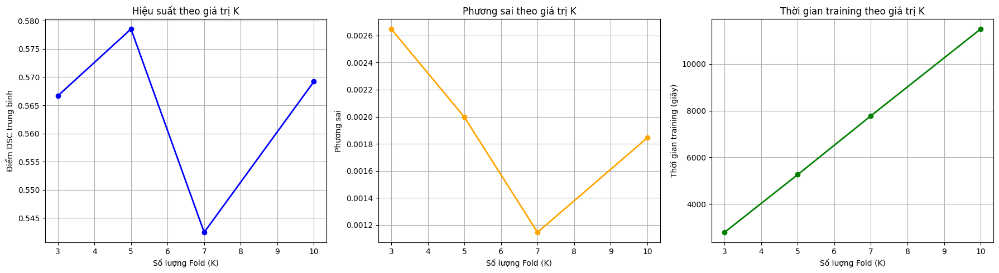

Training Fold 1/7


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [1/10], Train Loss: 0.9985, Val Loss: 1.3348
Accuracy: 0.4359, Mean IoU: 0.2214, Mean DSC/F1: 0.3370, Mean Precision: 0.3783
Saved best model with DSC: 0.3370
Best DSC: 0.3370, Best IoU: 0.2214
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [2/10], Train Loss: 0.9164, Val Loss: 1.2653
Accuracy: 0.4770, Mean IoU: 0.2414, Mean DSC/F1: 0.3553, Mean Precision: 0.3927
Saved best model with DSC: 0.3553
Best DSC: 0.3553, Best IoU: 0.2414
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [3/10], Train Loss: 0.8510, Val Loss: 1.2569
Accuracy: 0.4895, Mean IoU: 0.2460, Mean DSC/F1: 0.3585, Mean Precision: 0.4008
Saved best model with DSC: 0.3585
Best DSC: 0.3585, Best IoU: 0.2460
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [4/10], Train Loss: 0.7899, Val Loss: 1.3238
Accuracy: 0.5033, Mean IoU: 0.2575, Mean DSC/F1: 0.3745, Mean Precision: 0.4286
Saved best model with DSC: 0.3745
Best DSC: 0.3745, Best IoU: 0.2575
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.36it/s]


Epoch [5/10], Train Loss: 0.7336, Val Loss: 1.1496
Accuracy: 0.5690, Mean IoU: 0.2997, Mean DSC/F1: 0.4176, Mean Precision: 0.4627
Saved best model with DSC: 0.4176
Best DSC: 0.4176, Best IoU: 0.2997
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.40it/s]


Epoch [6/10], Train Loss: 0.6913, Val Loss: 1.1393
Accuracy: 0.5703, Mean IoU: 0.2996, Mean DSC/F1: 0.4169, Mean Precision: 0.4671
Best DSC: 0.4176, Best IoU: 0.2997
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [7/10], Train Loss: 0.6508, Val Loss: 0.8585
Accuracy: 0.7103, Mean IoU: 0.3648, Mean DSC/F1: 0.4644, Mean Precision: 0.5038
Saved best model with DSC: 0.4644
Best DSC: 0.4644, Best IoU: 0.3648
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [8/10], Train Loss: 0.6204, Val Loss: 0.7972
Accuracy: 0.7326, Mean IoU: 0.3829, Mean DSC/F1: 0.4794, Mean Precision: 0.5242
Saved best model with DSC: 0.4794
Best DSC: 0.4794, Best IoU: 0.3829
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [9/10], Train Loss: 0.5905, Val Loss: 0.8315
Accuracy: 0.7212, Mean IoU: 0.3835, Mean DSC/F1: 0.4837, Mean Precision: 0.5380
Saved best model with DSC: 0.4837
Best DSC: 0.4837, Best IoU: 0.3835
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]

Epoch [10/10], Train Loss: 0.5619, Val Loss: 0.9634
Accuracy: 0.6773, Mean IoU: 0.3649, Mean DSC/F1: 0.4751, Mean Precision: 0.5267
Best DSC: 0.4837, Best IoU: 0.3835
--------------------------------------------------


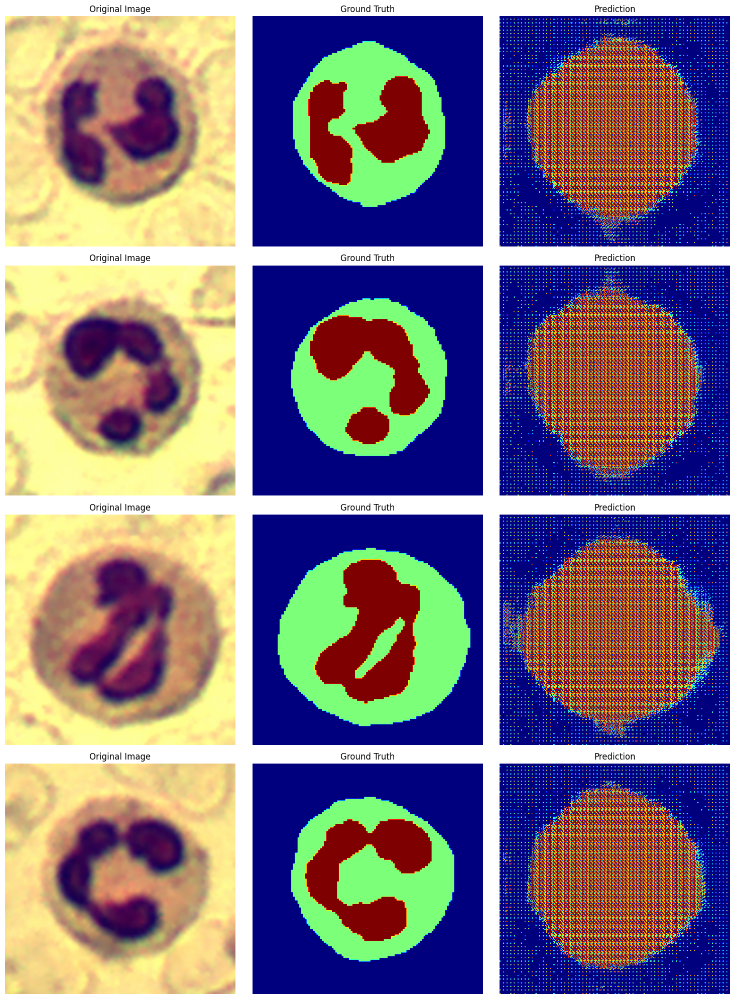

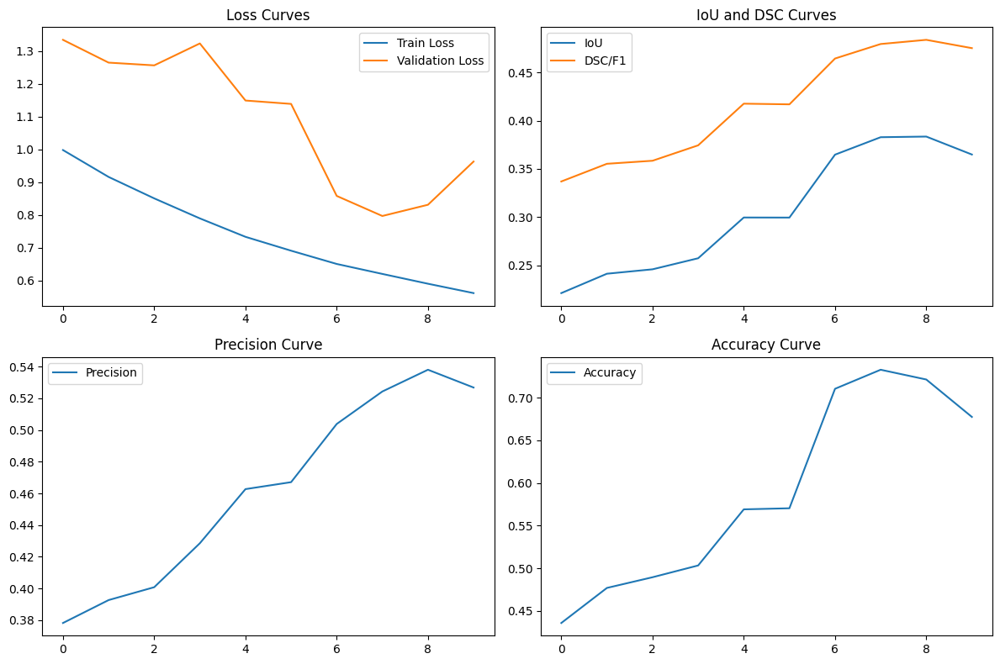

Training Fold 2/7


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [1/10], Train Loss: 0.9987, Val Loss: 1.0880
Accuracy: 0.4957, Mean IoU: 0.2742, Mean DSC/F1: 0.4099, Mean Precision: 0.4321
Saved best model with DSC: 0.4099
Best DSC: 0.4099, Best IoU: 0.2742
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [2/10], Train Loss: 0.9229, Val Loss: 1.0176
Accuracy: 0.5695, Mean IoU: 0.3198, Mean DSC/F1: 0.4547, Mean Precision: 0.4662
Saved best model with DSC: 0.4547
Best DSC: 0.4547, Best IoU: 0.3198
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [3/10], Train Loss: 0.8588, Val Loss: 0.9432
Accuracy: 0.6454, Mean IoU: 0.3676, Mean DSC/F1: 0.4986, Mean Precision: 0.4994
Saved best model with DSC: 0.4986
Best DSC: 0.4986, Best IoU: 0.3676
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [4/10], Train Loss: 0.7975, Val Loss: 0.8986
Accuracy: 0.6800, Mean IoU: 0.3749, Mean DSC/F1: 0.4973, Mean Precision: 0.5158
Best DSC: 0.4986, Best IoU: 0.3676
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [5/10], Train Loss: 0.7432, Val Loss: 0.8079
Accuracy: 0.7252, Mean IoU: 0.4191, Mean DSC/F1: 0.5440, Mean Precision: 0.5470
Saved best model with DSC: 0.5440
Best DSC: 0.5440, Best IoU: 0.4191
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.36it/s]


Epoch [6/10], Train Loss: 0.6989, Val Loss: 0.7748
Accuracy: 0.7336, Mean IoU: 0.4205, Mean DSC/F1: 0.5437, Mean Precision: 0.5596
Best DSC: 0.5440, Best IoU: 0.4191
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [7/10], Train Loss: 0.6603, Val Loss: 0.7327
Accuracy: 0.7225, Mean IoU: 0.3499, Mean DSC/F1: 0.4541, Mean Precision: 0.5310
Best DSC: 0.5440, Best IoU: 0.4191
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.36it/s]


Epoch [8/10], Train Loss: 0.6236, Val Loss: 0.6882
Accuracy: 0.7464, Mean IoU: 0.3986, Mean DSC/F1: 0.5096, Mean Precision: 0.5539
Best DSC: 0.5440, Best IoU: 0.4191
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [9/10], Train Loss: 0.5989, Val Loss: 0.6178
Accuracy: 0.7598, Mean IoU: 0.4145, Mean DSC/F1: 0.5242, Mean Precision: 0.5709
Best DSC: 0.5440, Best IoU: 0.4191
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]

Epoch [10/10], Train Loss: 0.5689, Val Loss: 0.6301
Accuracy: 0.7651, Mean IoU: 0.4231, Mean DSC/F1: 0.5349, Mean Precision: 0.5808
Best DSC: 0.5440, Best IoU: 0.4191
--------------------------------------------------


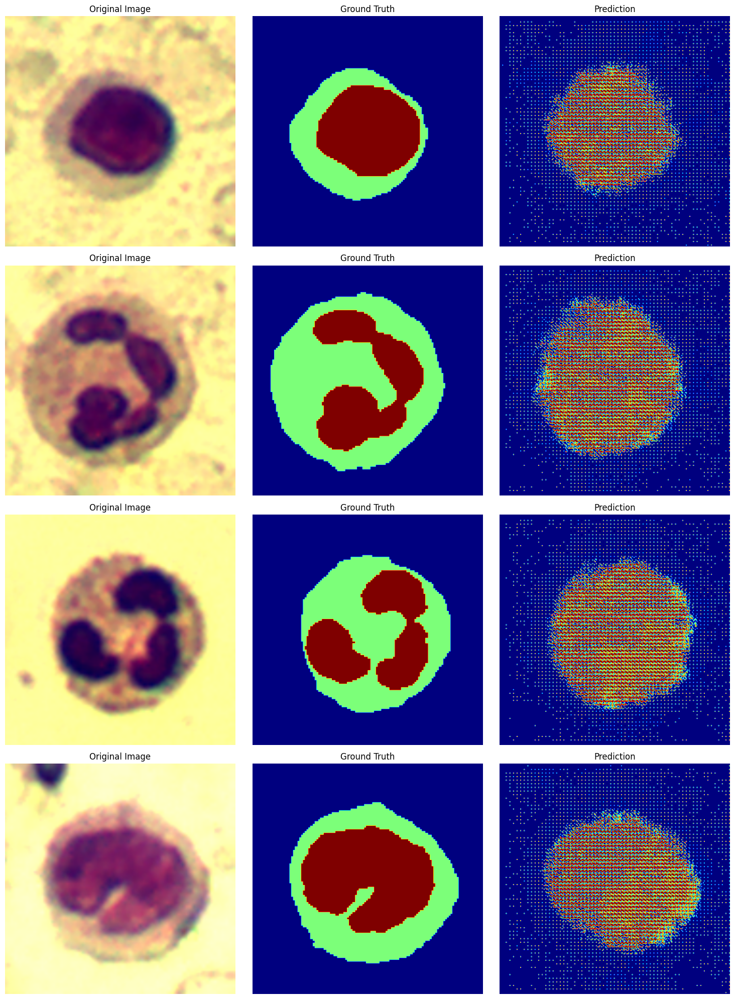

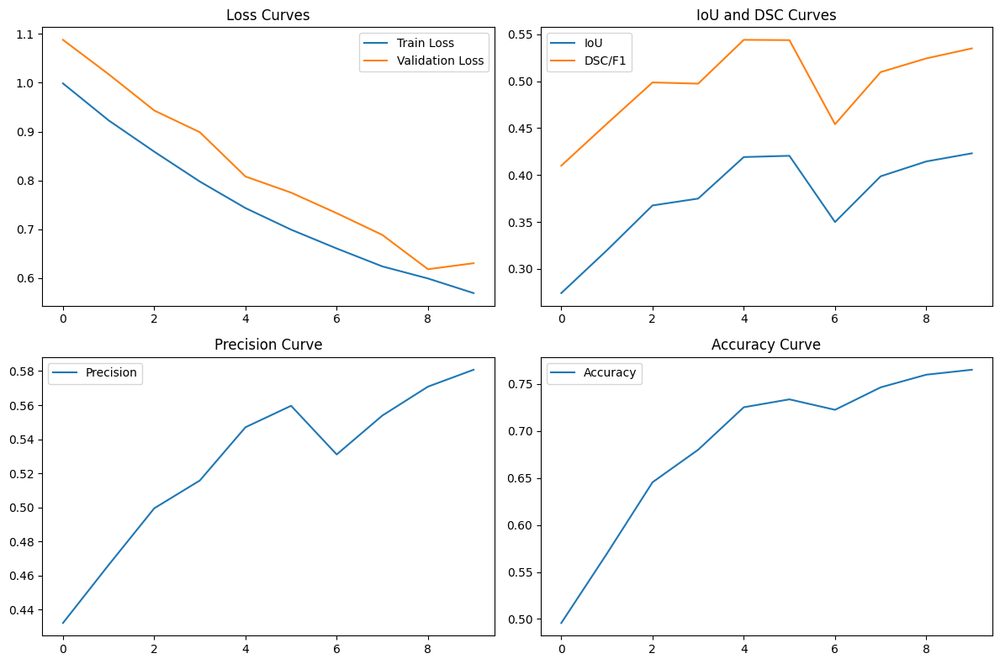

Training Fold 3/7


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [1/10], Train Loss: 0.9707, Val Loss: 1.0511
Accuracy: 0.5795, Mean IoU: 0.2780, Mean DSC/F1: 0.3818, Mean Precision: 0.3832
Saved best model with DSC: 0.3818
Best DSC: 0.3818, Best IoU: 0.2780
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [2/10], Train Loss: 0.8964, Val Loss: 1.0396
Accuracy: 0.6143, Mean IoU: 0.3036, Mean DSC/F1: 0.4092, Mean Precision: 0.4503
Saved best model with DSC: 0.4092
Best DSC: 0.4092, Best IoU: 0.3036
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.36it/s]


Epoch [3/10], Train Loss: 0.8326, Val Loss: 0.9598
Accuracy: 0.6704, Mean IoU: 0.3304, Mean DSC/F1: 0.4299, Mean Precision: 0.4618
Saved best model with DSC: 0.4299
Best DSC: 0.4299, Best IoU: 0.3304
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [4/10], Train Loss: 0.7758, Val Loss: 0.9256
Accuracy: 0.6842, Mean IoU: 0.3419, Mean DSC/F1: 0.4424, Mean Precision: 0.4803
Saved best model with DSC: 0.4424
Best DSC: 0.4424, Best IoU: 0.3419
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.36it/s]


Epoch [5/10], Train Loss: 0.7218, Val Loss: 0.8925
Accuracy: 0.6890, Mean IoU: 0.3452, Mean DSC/F1: 0.4464, Mean Precision: 0.5015
Saved best model with DSC: 0.4464
Best DSC: 0.4464, Best IoU: 0.3452
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.36it/s]


Epoch [6/10], Train Loss: 0.6819, Val Loss: 0.7966
Accuracy: 0.7398, Mean IoU: 0.3815, Mean DSC/F1: 0.4877, Mean Precision: 0.5661
Saved best model with DSC: 0.4877
Best DSC: 0.4877, Best IoU: 0.3815
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [7/10], Train Loss: 0.6399, Val Loss: 0.7714
Accuracy: 0.7384, Mean IoU: 0.4174, Mean DSC/F1: 0.5415, Mean Precision: 0.5624
Saved best model with DSC: 0.5415
Best DSC: 0.5415, Best IoU: 0.4174
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [8/10], Train Loss: 0.6114, Val Loss: 0.6843
Accuracy: 0.7547, Mean IoU: 0.4005, Mean DSC/F1: 0.5239, Mean Precision: 0.7078
Best DSC: 0.5415, Best IoU: 0.4174
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [9/10], Train Loss: 0.5711, Val Loss: 0.6771
Accuracy: 0.7582, Mean IoU: 0.3961, Mean DSC/F1: 0.5084, Mean Precision: 0.6459
Best DSC: 0.5415, Best IoU: 0.4174
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [10/10], Train Loss: 0.5401, Val Loss: 0.5872
Accuracy: 0.7905, Mean IoU: 0.4796, Mean DSC/F1: 0.6123, Mean Precision: 0.6794
Saved best model with DSC: 0.6123
Best DSC: 0.6123, Best IoU: 0.4796
--------------------------------------------------


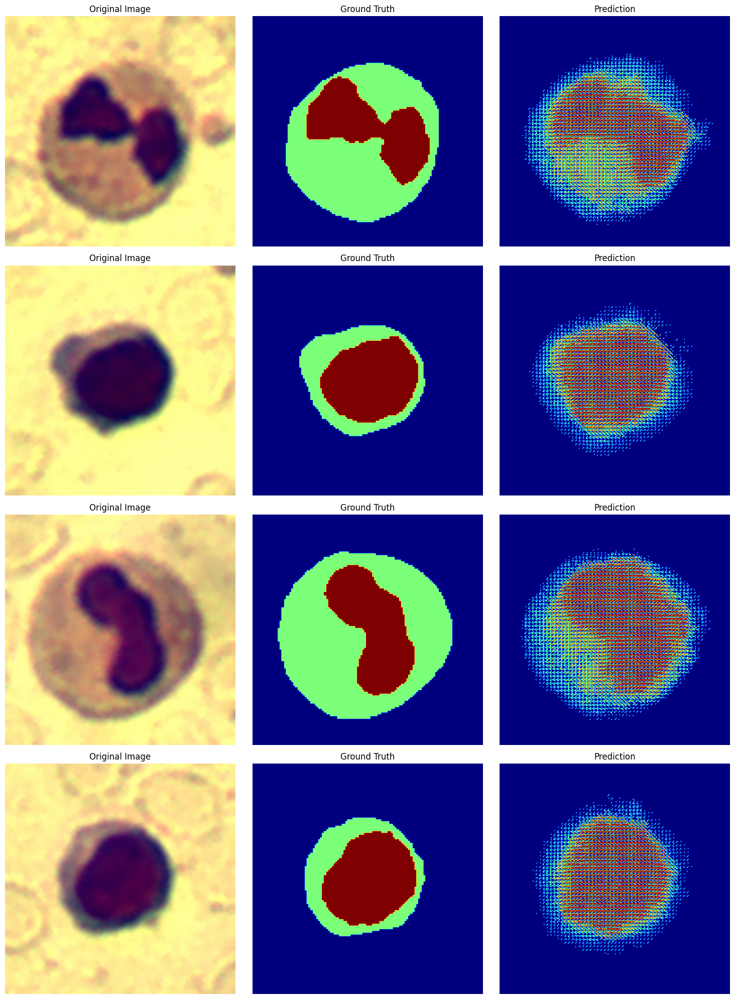

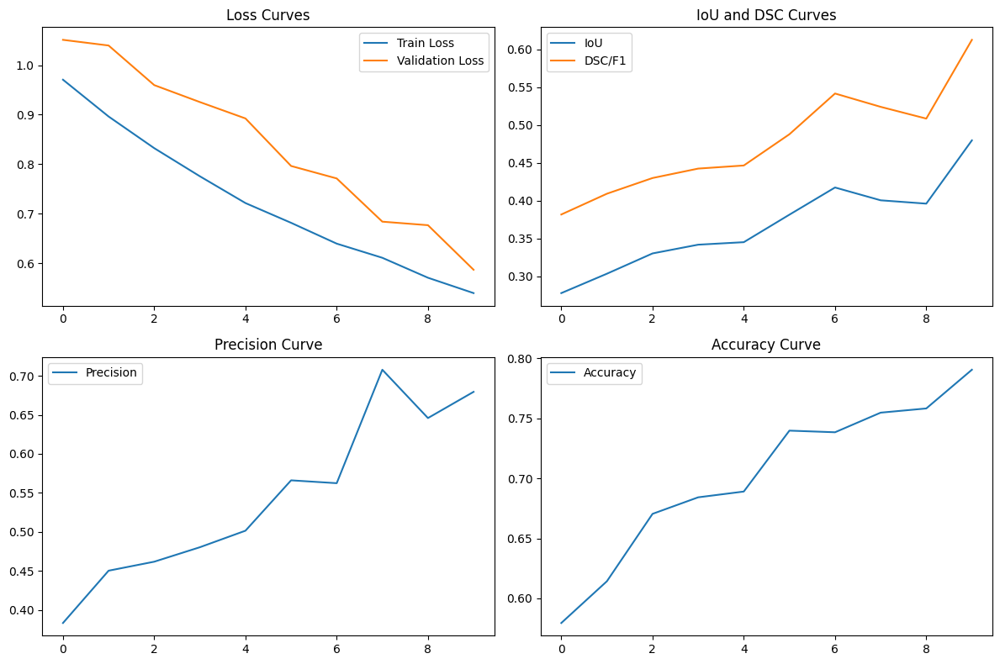

Training Fold 4/7


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.35it/s]


Epoch [1/10], Train Loss: 0.9699, Val Loss: 1.0205
Accuracy: 0.5694, Mean IoU: 0.3068, Mean DSC/F1: 0.4320, Mean Precision: 0.4447
Saved best model with DSC: 0.4320
Best DSC: 0.4320, Best IoU: 0.3068
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [2/10], Train Loss: 0.8905, Val Loss: 0.9600
Accuracy: 0.6269, Mean IoU: 0.3355, Mean DSC/F1: 0.4527, Mean Precision: 0.4727
Saved best model with DSC: 0.4527
Best DSC: 0.4527, Best IoU: 0.3355
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.36it/s]


Epoch [3/10], Train Loss: 0.8300, Val Loss: 0.8599
Accuracy: 0.6966, Mean IoU: 0.3782, Mean DSC/F1: 0.4906, Mean Precision: 0.5221
Saved best model with DSC: 0.4906
Best DSC: 0.4906, Best IoU: 0.3782
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [4/10], Train Loss: 0.7692, Val Loss: 0.8528
Accuracy: 0.7063, Mean IoU: 0.3980, Mean DSC/F1: 0.5145, Mean Precision: 0.5410
Saved best model with DSC: 0.5145
Best DSC: 0.5145, Best IoU: 0.3980
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [5/10], Train Loss: 0.7155, Val Loss: 0.7748
Accuracy: 0.7474, Mean IoU: 0.4265, Mean DSC/F1: 0.5397, Mean Precision: 0.5644
Saved best model with DSC: 0.5397
Best DSC: 0.5397, Best IoU: 0.4265
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [6/10], Train Loss: 0.6722, Val Loss: 0.7347
Accuracy: 0.7571, Mean IoU: 0.4156, Mean DSC/F1: 0.5169, Mean Precision: 0.5630
Best DSC: 0.5397, Best IoU: 0.4265
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [7/10], Train Loss: 0.6343, Val Loss: 0.7061
Accuracy: 0.7514, Mean IoU: 0.4060, Mean DSC/F1: 0.5053, Mean Precision: 0.6131
Best DSC: 0.5397, Best IoU: 0.4265
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [8/10], Train Loss: 0.5994, Val Loss: 0.7138
Accuracy: 0.6964, Mean IoU: 0.2703, Mean DSC/F1: 0.3434, Mean Precision: 0.6662
Best DSC: 0.5397, Best IoU: 0.4265
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [9/10], Train Loss: 0.5605, Val Loss: 0.6440
Accuracy: 0.7243, Mean IoU: 0.3451, Mean DSC/F1: 0.4376, Mean Precision: 0.7099
Best DSC: 0.5397, Best IoU: 0.4265
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [10/10], Train Loss: 0.5360, Val Loss: 0.5752
Accuracy: 0.7767, Mean IoU: 0.4447, Mean DSC/F1: 0.5417, Mean Precision: 0.6493
Saved best model with DSC: 0.5417
Best DSC: 0.5417, Best IoU: 0.4447
--------------------------------------------------


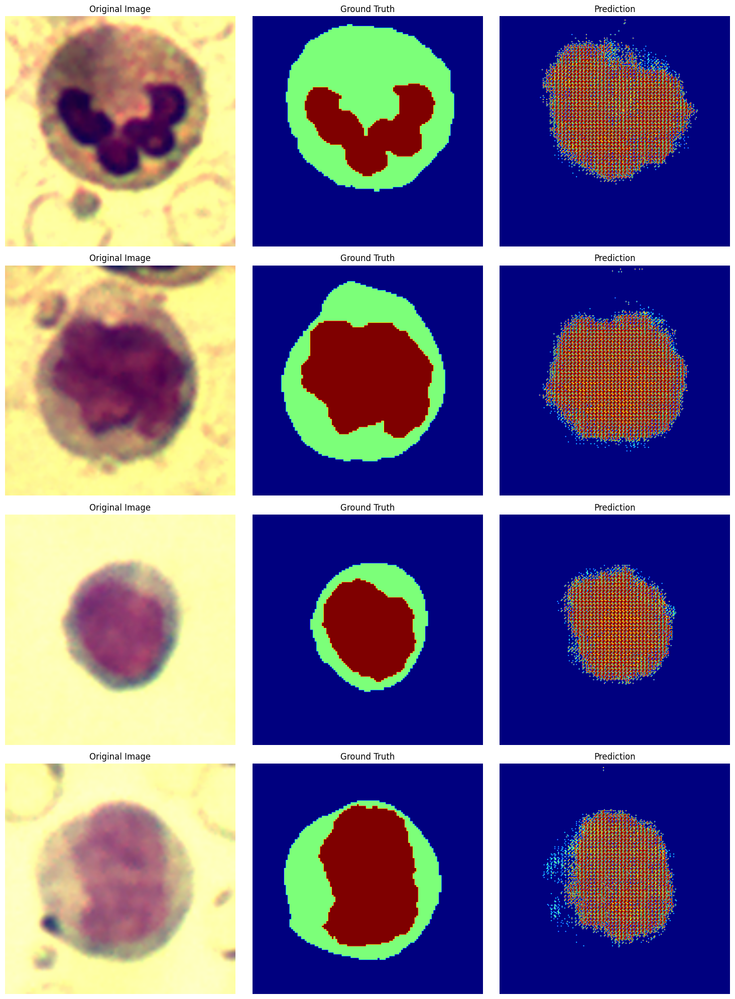

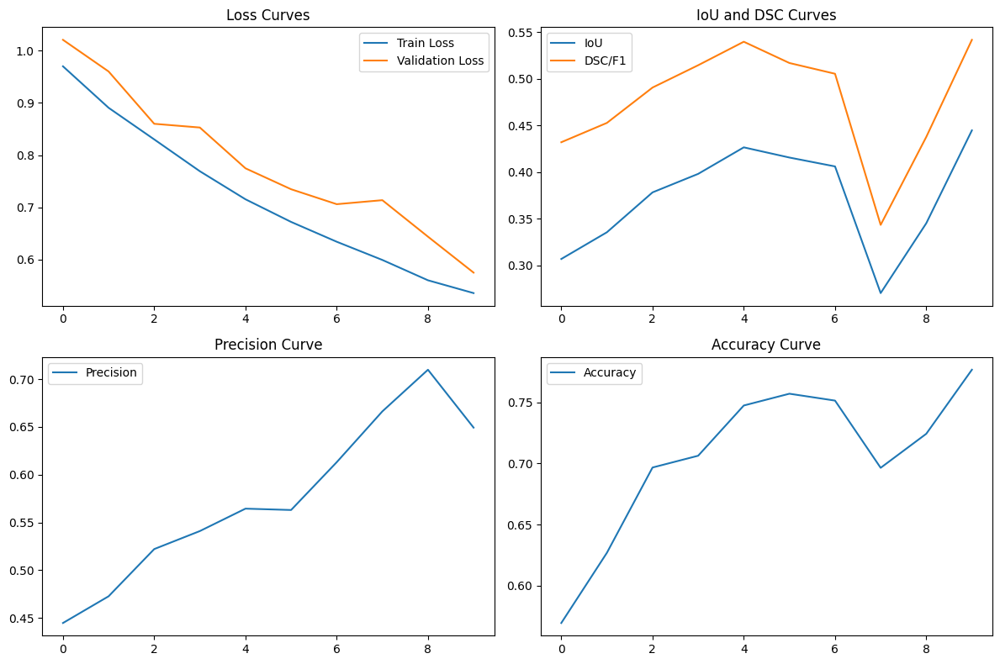

Training Fold 5/7


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [1/10], Train Loss: 1.0742, Val Loss: 1.2126
Accuracy: 0.3854, Mean IoU: 0.2039, Mean DSC/F1: 0.3225, Mean Precision: 0.3839
Saved best model with DSC: 0.3225
Best DSC: 0.3225, Best IoU: 0.2039
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [2/10], Train Loss: 0.9788, Val Loss: 0.9565
Accuracy: 0.5931, Mean IoU: 0.3273, Mean DSC/F1: 0.4607, Mean Precision: 0.4593
Saved best model with DSC: 0.4607
Best DSC: 0.4607, Best IoU: 0.3273
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [3/10], Train Loss: 0.9014, Val Loss: 0.9529
Accuracy: 0.6078, Mean IoU: 0.3329, Mean DSC/F1: 0.4603, Mean Precision: 0.4632
Best DSC: 0.4607, Best IoU: 0.3273
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [4/10], Train Loss: 0.8344, Val Loss: 0.9052
Accuracy: 0.6646, Mean IoU: 0.3661, Mean DSC/F1: 0.4871, Mean Precision: 0.4988
Saved best model with DSC: 0.4871
Best DSC: 0.4871, Best IoU: 0.3661
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [5/10], Train Loss: 0.7760, Val Loss: 0.8758
Accuracy: 0.6834, Mean IoU: 0.3778, Mean DSC/F1: 0.4965, Mean Precision: 0.5152
Saved best model with DSC: 0.4965
Best DSC: 0.4965, Best IoU: 0.3778
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [6/10], Train Loss: 0.7251, Val Loss: 0.8128
Accuracy: 0.7187, Mean IoU: 0.3838, Mean DSC/F1: 0.4912, Mean Precision: 0.5261
Best DSC: 0.4965, Best IoU: 0.3778
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [7/10], Train Loss: 0.6973, Val Loss: 0.7696
Accuracy: 0.7357, Mean IoU: 0.3961, Mean DSC/F1: 0.5006, Mean Precision: 0.5237
Saved best model with DSC: 0.5006
Best DSC: 0.5006, Best IoU: 0.3961
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [8/10], Train Loss: 0.6604, Val Loss: 0.7355
Accuracy: 0.7484, Mean IoU: 0.4118, Mean DSC/F1: 0.5195, Mean Precision: 0.5480
Saved best model with DSC: 0.5195
Best DSC: 0.5195, Best IoU: 0.4118
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [9/10], Train Loss: 0.6364, Val Loss: 0.7271
Accuracy: 0.7344, Mean IoU: 0.3993, Mean DSC/F1: 0.5038, Mean Precision: 0.5202
Best DSC: 0.5195, Best IoU: 0.4118
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [10/10], Train Loss: 0.6090, Val Loss: 0.6884
Accuracy: 0.7473, Mean IoU: 0.4207, Mean DSC/F1: 0.5328, Mean Precision: 0.5567
Saved best model with DSC: 0.5328
Best DSC: 0.5328, Best IoU: 0.4207
--------------------------------------------------


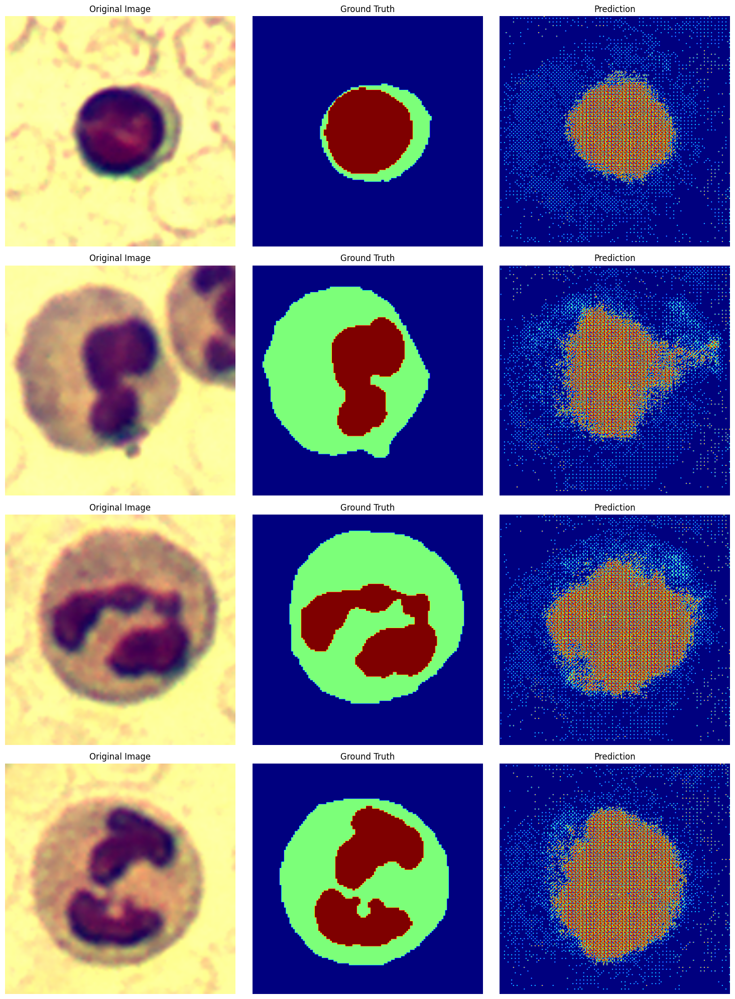

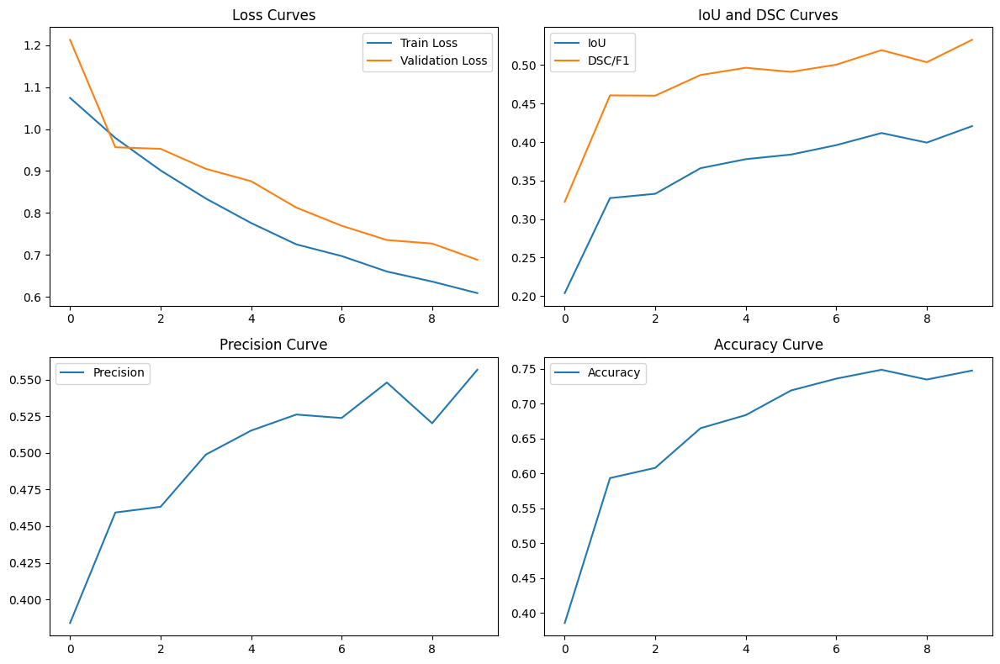

Training Fold 6/7


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [1/10], Train Loss: 0.9597, Val Loss: 1.0639
Accuracy: 0.5707, Mean IoU: 0.3213, Mean DSC/F1: 0.4558, Mean Precision: 0.4646
Saved best model with DSC: 0.4558
Best DSC: 0.4558, Best IoU: 0.3213
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [2/10], Train Loss: 0.8787, Val Loss: 0.9757
Accuracy: 0.6452, Mean IoU: 0.3713, Mean DSC/F1: 0.5046, Mean Precision: 0.5024
Saved best model with DSC: 0.5046
Best DSC: 0.5046, Best IoU: 0.3713
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [3/10], Train Loss: 0.8171, Val Loss: 0.9470
Accuracy: 0.6567, Mean IoU: 0.3738, Mean DSC/F1: 0.5030, Mean Precision: 0.5022
Best DSC: 0.5046, Best IoU: 0.3713
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [4/10], Train Loss: 0.7534, Val Loss: 0.8896
Accuracy: 0.6996, Mean IoU: 0.4011, Mean DSC/F1: 0.5278, Mean Precision: 0.5326
Saved best model with DSC: 0.5278
Best DSC: 0.5278, Best IoU: 0.4011
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [5/10], Train Loss: 0.7105, Val Loss: 0.8512
Accuracy: 0.7182, Mean IoU: 0.4034, Mean DSC/F1: 0.5255, Mean Precision: 0.5433
Best DSC: 0.5278, Best IoU: 0.4011
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [6/10], Train Loss: 0.6715, Val Loss: 0.8285
Accuracy: 0.7140, Mean IoU: 0.4022, Mean DSC/F1: 0.5244, Mean Precision: 0.5481
Best DSC: 0.5278, Best IoU: 0.4011
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [7/10], Train Loss: 0.6392, Val Loss: 0.7651
Accuracy: 0.7376, Mean IoU: 0.4183, Mean DSC/F1: 0.5399, Mean Precision: 0.5642
Saved best model with DSC: 0.5399
Best DSC: 0.5399, Best IoU: 0.4183
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [8/10], Train Loss: 0.6054, Val Loss: 0.6922
Accuracy: 0.7769, Mean IoU: 0.4660, Mean DSC/F1: 0.5912, Mean Precision: 0.6088
Saved best model with DSC: 0.5912
Best DSC: 0.5912, Best IoU: 0.4660
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]


Epoch [9/10], Train Loss: 0.5794, Val Loss: 0.6875
Accuracy: 0.7740, Mean IoU: 0.4770, Mean DSC/F1: 0.6017, Mean Precision: 0.6076
Saved best model with DSC: 0.6017
Best DSC: 0.6017, Best IoU: 0.4770
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


Epoch [10/10], Train Loss: 0.5547, Val Loss: 0.6436
Accuracy: 0.8009, Mean IoU: 0.5091, Mean DSC/F1: 0.6361, Mean Precision: 0.6420
Saved best model with DSC: 0.6361
Best DSC: 0.6361, Best IoU: 0.5091
--------------------------------------------------


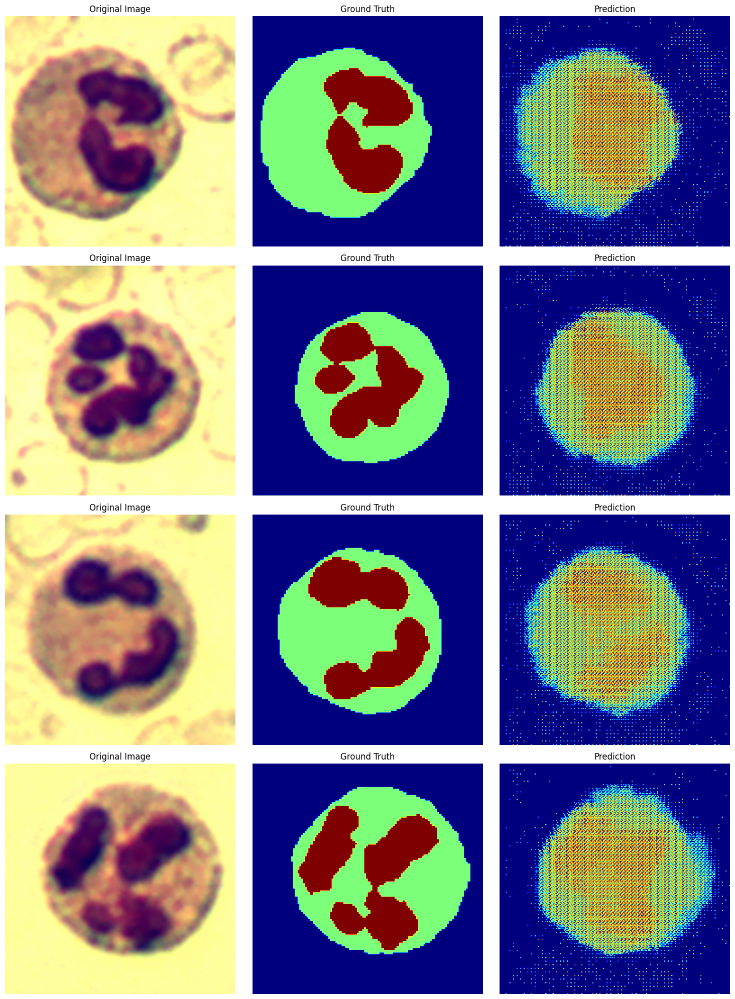

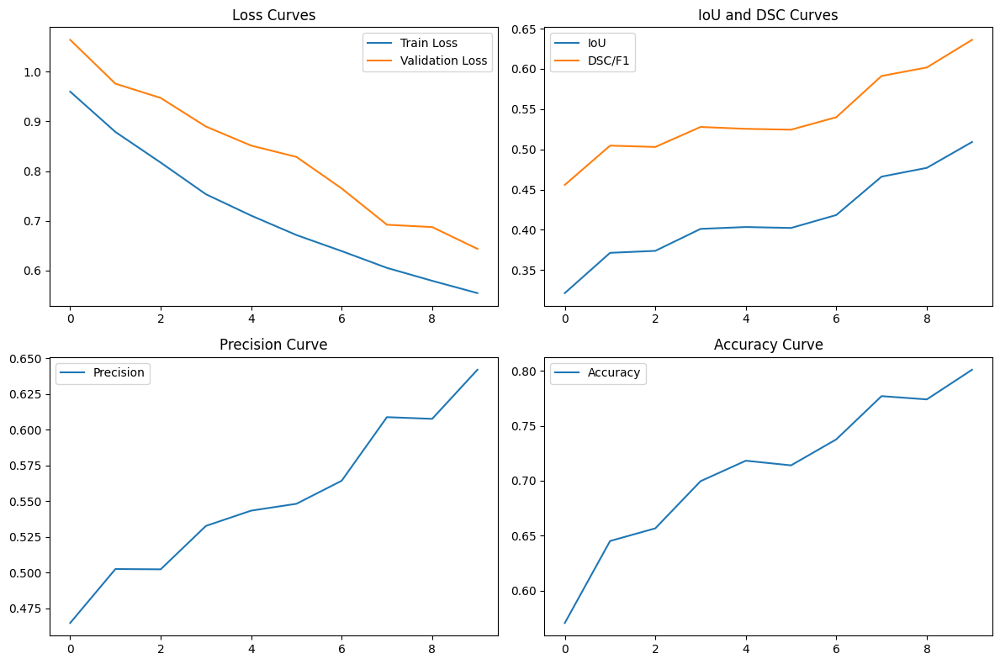

Training Fold 7/7


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.40it/s]


Epoch [1/10], Train Loss: 1.0355, Val Loss: 1.4253
Accuracy: 0.3613, Mean IoU: 0.2008, Mean DSC/F1: 0.3268, Mean Precision: 0.3999
Saved best model with DSC: 0.3268
Best DSC: 0.3268, Best IoU: 0.2008
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [2/10], Train Loss: 0.9409, Val Loss: 1.2479
Accuracy: 0.4485, Mean IoU: 0.2465, Mean DSC/F1: 0.3776, Mean Precision: 0.4161
Saved best model with DSC: 0.3776
Best DSC: 0.3776, Best IoU: 0.2465
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.41it/s]


Epoch [3/10], Train Loss: 0.8670, Val Loss: 1.1298
Accuracy: 0.4977, Mean IoU: 0.2752, Mean DSC/F1: 0.4075, Mean Precision: 0.4336
Saved best model with DSC: 0.4075
Best DSC: 0.4075, Best IoU: 0.2752
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]


Epoch [4/10], Train Loss: 0.8049, Val Loss: 1.0101
Accuracy: 0.5900, Mean IoU: 0.3302, Mean DSC/F1: 0.4609, Mean Precision: 0.4697
Saved best model with DSC: 0.4609
Best DSC: 0.4609, Best IoU: 0.3302
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.40it/s]


Epoch [5/10], Train Loss: 0.7440, Val Loss: 1.0609
Accuracy: 0.5532, Mean IoU: 0.3052, Mean DSC/F1: 0.4339, Mean Precision: 0.4555
Best DSC: 0.4609, Best IoU: 0.3302
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.40it/s]


Epoch [6/10], Train Loss: 0.6973, Val Loss: 0.9323
Accuracy: 0.6423, Mean IoU: 0.3421, Mean DSC/F1: 0.4584, Mean Precision: 0.4874
Best DSC: 0.4609, Best IoU: 0.3302
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.42it/s]


Epoch [7/10], Train Loss: 0.6543, Val Loss: 0.9109
Accuracy: 0.6610, Mean IoU: 0.3526, Mean DSC/F1: 0.4651, Mean Precision: 0.4954
Saved best model with DSC: 0.4651
Best DSC: 0.4651, Best IoU: 0.3526
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.42it/s]


Epoch [8/10], Train Loss: 0.6258, Val Loss: 0.7822
Accuracy: 0.7127, Mean IoU: 0.3720, Mean DSC/F1: 0.4714, Mean Precision: 0.4863
Saved best model with DSC: 0.4714
Best DSC: 0.4714, Best IoU: 0.3720
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.43it/s]


Epoch [9/10], Train Loss: 0.5884, Val Loss: 0.7478
Accuracy: 0.7126, Mean IoU: 0.3556, Mean DSC/F1: 0.4435, Mean Precision: 0.4370
Best DSC: 0.4714, Best IoU: 0.3720
--------------------------------------------------


Validation: 100%|██████████| 11/11 [00:04<00:00,  2.41it/s]


Epoch [10/10], Train Loss: 0.5568, Val Loss: 0.7540
Accuracy: 0.7248, Mean IoU: 0.4038, Mean DSC/F1: 0.5128, Mean Precision: 0.5381
Saved best model with DSC: 0.5128
Best DSC: 0.5128, Best IoU: 0.4038
--------------------------------------------------


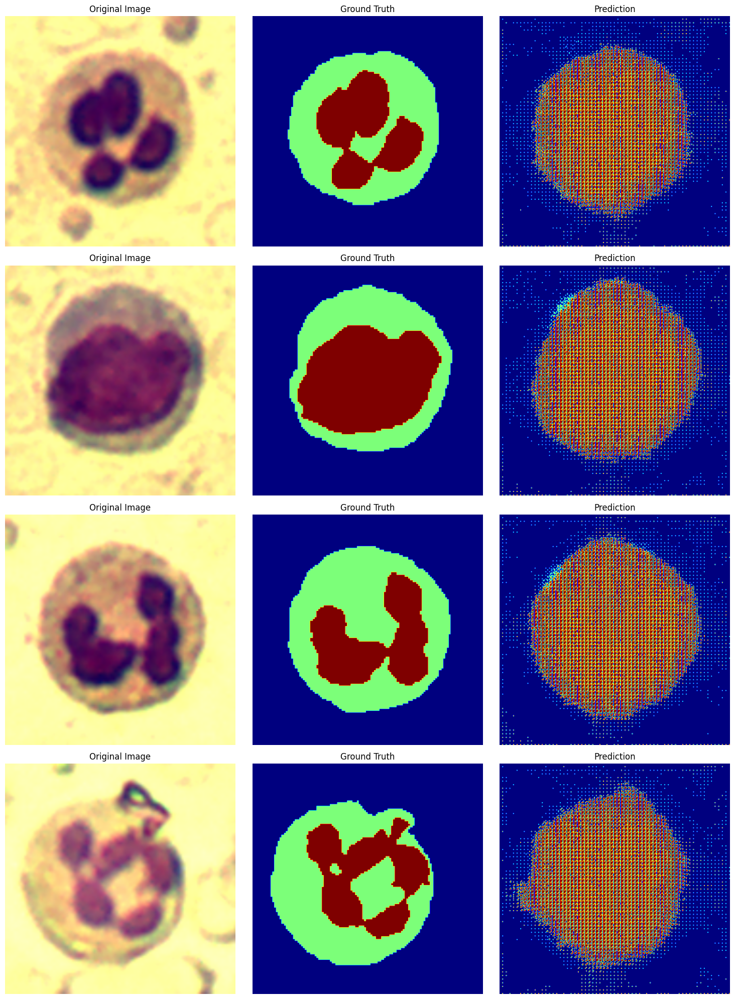

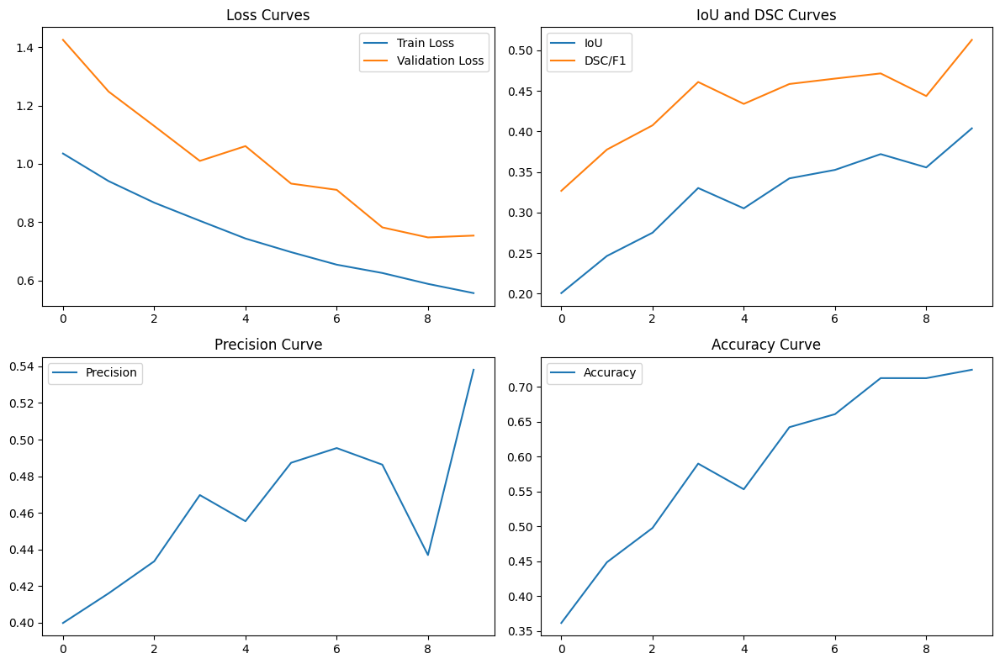


Average metrics across all folds:
Avg IoU: 0.4372
Avg DSC/F1: 0.5519
Avg Precision: 0.5929
Avg Accuracy: 0.7552


In [21]:
def run_training():
    print(f"Using device: {DEVICE}")
    
    root_dir = Path('/kaggle/input/data-1/content')
    all_images = sorted(list((root_dir / 'images').glob('*.bmp')))
    all_masks = sorted(list((root_dir / 'masks').glob('*.png')))
    
    all_images = sorted(all_images, key=lambda x: x.stem)
    all_masks = sorted(all_masks, key=lambda x: x.stem)
    
    print(f"Total images: {len(all_images)}")
    print(f"Total masks: {len(all_masks)}")
    
    optimal_k = find_optimal_k(
        all_images, all_masks, 
        k_values=[3, 5, 7, 10], 
        num_epochs=10
    )
    
    kf = KFold(n_splits=optimal_k, shuffle=True, random_state=SEED)
    fold_metrics = []
    
    for fold, (train_idx, val_idx) in enumerate(kf.split(all_images)):
        print(f"Training Fold {fold+1}/{optimal_k}")

        train_img = [all_images[i] for i in train_idx]
        train_mask = [all_masks[i] for i in train_idx]
        val_img = [all_images[i] for i in val_idx]
        val_mask = [all_masks[i] for i in val_idx]
        
        # Create datasets
        train_dataset = SegmentationDataset(train_img, train_mask, get_train_transform())
        val_dataset = SegmentationDataset(val_img, val_mask, get_valid_transform())
        
        # Create dataloaders
        train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
        val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
        
        # Initialize model
        model = UNetOscillatoryNeuron().to(DEVICE)
        
        # Setup optimizer and loss
        optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE)
        criterion = nn.CrossEntropyLoss()
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)
        
        # Train model
        model, history, best_metrics = train_model(
            model, 
            train_loader, 
            val_loader,
            optimizer,
            criterion,
            scheduler,
            NUM_EPOCHS,
            DEVICE,
            fold=fold
        )
        
        # Save metrics
        fold_metrics.append(best_metrics)
        
        # Visualize predictions
        visualize_predictions(model, val_loader, DEVICE)
        
        # Plot learning curves
        plt.figure(figsize=(12, 8))
        
        plt.subplot(2, 2, 1)
        plt.plot(history['train_loss'], label='Train Loss')
        plt.plot(history['val_loss'], label='Validation Loss')
        plt.legend()
        plt.title('Loss Curves')
        
        plt.subplot(2, 2, 2)
        plt.plot(history['iou'], label='IoU')
        plt.plot(history['dsc'], label='DSC/F1')
        plt.legend()
        plt.title('IoU and DSC Curves')
        
        plt.subplot(2, 2, 3)
        plt.plot(history['precision'], label='Precision')
        plt.legend()
        plt.title('Precision Curve')
        
        plt.subplot(2, 2, 4)
        plt.plot(history['accuracy'], label='Accuracy')
        plt.legend()
        plt.title('Accuracy Curve')
        
        plt.tight_layout()
        plt.savefig(f'learning_curves_fold{fold}.png')
        plt.show()
    
    # Print overall metrics
    print("\nAverage metrics across all folds:")
    avg_iou = np.mean([metrics['mean_iou'] for metrics in fold_metrics])
    avg_dsc = np.mean([metrics['mean_dsc'] for metrics in fold_metrics])
    avg_precision = np.mean([metrics['mean_precision'] for metrics in fold_metrics])
    avg_acc = np.mean([metrics['mean_acc'] for metrics in fold_metrics])
    
    print(f"Avg IoU: {avg_iou:.4f}")
    print(f"Avg DSC/F1: {avg_dsc:.4f}")
    print(f"Avg Precision: {avg_precision:.4f}")
    print(f"Avg Accuracy: {avg_acc:.4f}")

# Run the training
if __name__ == "__main__":
    run_training()